In [ ]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os

In [ ]:
# chosen = []
# for i in os.listdir(r"C:\Users\sakho\Downloads\labelImg-master\labelImg-master\output300300"):
#     print(i.split('.txt')[0]+'.png')
#     chosen.append(i.split('.txt')[0]+'.png')

In [ ]:
# len(chosen)

97

In [ ]:
# import shutil

# folder_asal = r"C:\Users\sakho\Downloads\labelImg-master\labelImg-master\Processed_train300300"  # Folder asal
# folder_tujuan =r"C:\Users\sakho\Downloads\labelImg-master\labelImg-master\outputimg300300"  # Folder tujuan

# # Membuat folder tujuan jika belum ada
# if not os.path.exists(folder_tujuan):
#     os.makedirs(folder_tujuan)

# # Memindahkan gambar-gambar
# for gambar in chosen:
#     path_asal = os.path.join(folder_asal, gambar)
#     path_tujuan = os.path.join(folder_tujuan, gambar)
#     shutil.move(path_asal, path_tujuan)

In [ ]:
!pip install rarfile


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rarfile

rar_path = '/content/drive/MyDrive/satriadata2023/output300300.rar'  # Ganti dengan path ke file RAR yang ingin Anda unpack
extract_path = '/content/output300300'  # Ganti dengan path di mana Anda ingin mengekstrak file

with rarfile.RarFile(rar_path, 'r') as rar_ref:
    rar_ref.extractall(extract_path)

In [ ]:
rar_path = '/content/drive/MyDrive/satriadata2023/outputimg300300.rar'  # Ganti dengan path ke file RAR yang ingin Anda unpack
extract_path = '/content/outputimg300300'  # Ganti dengan path di mana Anda ingin mengekstrak file

with rarfile.RarFile(rar_path, 'r') as rar_ref:
    rar_ref.extractall(extract_path)

In [ ]:
len(os.listdir('/content/outputimg300300/outputimg300300'))
# len(os.listdir('/content/output300300/outputimg300300'))

763

In [ ]:
len(os.listdir('/content/output300300/output300300'))

763

In [ ]:
file_path = 'classes.txt'  # Ganti dengan path yang sesuai dengan lokasi file classes.txt
for i in os.listdir('/content/output300300/output300300'):
  if os.path.exists(os.path.join('/content/output300300/output300300',file_path)):
      os.remove(os.path.join('/content/output300300/output300300',file_path))
      print(f"File '{os.path.join('/content/output300300/output300300',file_path)}' berhasil dihapus.")
  # else:
  #     print(f"File '{os.path.join('/content/output300300/output300300',file_path)}' tidak ditemukan.")

File '/content/output300300/output300300/classes.txt' berhasil dihapus.


In [ ]:
len(os.listdir('/content/output300300/output300300'))

763

In [ ]:
import rarfile
rar_path = '/content/drive/MyDrive/satriadata2023/datatest_bdc.rar'
extract_path = '/content/datatest_bdc'  # Ganti dengan path di mana Anda ingin mengekstrak file

with rarfile.RarFile(rar_path, 'r') as rar_ref:
    rar_ref.extractall(extract_path)

In [ ]:
import rarfile
rar_path = '/content/drive/MyDrive/satriadata2023/imgtest300300.rar'
extract_path = '/content/datatest_bdc300300'  # Ganti dengan path di mana Anda ingin mengekstrak file

with rarfile.RarFile(rar_path, 'r') as rar_ref:
    rar_ref.extractall(extract_path)

In [ ]:
base = "/content/output300300/output300300"
dfs = []

for i in os.listdir(base):
    path = os.path.join(base, i)
    if os.path.isfile(path) and path.endswith('.txt'):
        try:
          annot = pd.read_csv(path, sep=' ', header=None)
          file_name = os.path.basename(path)
          annot.columns = ['label', 'center_x', 'center_y', 'width', 'height']
          annot['img'] = file_name.replace('.txt', '.png')
          dfs.append(annot)
        except:
          None

# Menggabungkan semua DataFrame menjadi satu DataFrame tunggal
combined_df = pd.concat(dfs, ignore_index=True)

In [ ]:
combined_df

,label,center_x,center_y,width,height,img
0,1,0.193333,0.353333,0.073333,0.486667,DataTrain240.png
1,27,0.363333,0.403333,0.040000,0.446667,DataTrain240.png
2,30,0.425000,0.431667,0.070000,0.450000,DataTrain240.png
3,34,0.486667,0.441667,0.073333,0.450000,DataTrain240.png
4,33,0.558333,0.470000,0.070000,0.460000,DataTrain240.png
...,...,...,...,...,...,...
5783,31,0.446667,0.445000,0.053333,0.350000,DataTrain396.png
5784,32,0.495000,0.450000,0.050000,0.360000,DataTrain396.png
5785,29,0.550000,0.458333,0.053333,0.356667,DataTrain396.png
5786,20,0.680000,0.458333,0.053333,0.356667,DataTrain396.png


In [ ]:
len(combined_df['img'].unique())

763

In [ ]:
combined_df['label'].value_counts()

27    848
1     707
28    273
0     258
32    253
34    251
26    246
35    238
31    230
30    230
33    222
29    220
19    163
9     144
20    113
18    103
3      99
10     99
4      97
5      90
25     80
17     76
13     74
21     73
16     71
14     71
11     70
15     57
8      55
24     55
12     49
22     45
2      36
7      35
6      33
23     24
Name: label, dtype: int64

In [ ]:
len(combined_df['label'].value_counts())

36

In [ ]:
def decode_label(encoded_label):
    if 0 <= encoded_label <= 25:
        return chr(encoded_label + 65)  # Menambahkan 65 untuk mendapatkan karakter abjad kapital ASCII
    elif 26 <= encoded_label <= 35:
        return str(encoded_label - 26)  # Mengurangi 26 untuk mendapatkan angka ASCII

    return None  # Mengembalikan None jika label di luar rentang 0-35

In [ ]:
combined_df['labelasli'] = combined_df['label'].apply(decode_label)

In [ ]:
combined_df

,label,center_x,center_y,width,height,img,labelasli
0,1,0.193333,0.353333,0.073333,0.486667,DataTrain240.png,B
1,27,0.363333,0.403333,0.040000,0.446667,DataTrain240.png,1
2,30,0.425000,0.431667,0.070000,0.450000,DataTrain240.png,4
3,34,0.486667,0.441667,0.073333,0.450000,DataTrain240.png,8
4,33,0.558333,0.470000,0.070000,0.460000,DataTrain240.png,7
...,...,...,...,...,...,...,...
5783,31,0.446667,0.445000,0.053333,0.350000,DataTrain396.png,5
5784,32,0.495000,0.450000,0.050000,0.360000,DataTrain396.png,6
5785,29,0.550000,0.458333,0.053333,0.356667,DataTrain396.png,3
5786,20,0.680000,0.458333,0.053333,0.356667,DataTrain396.png,U


In [ ]:
combined_df['labelasli'].value_counts()

1    848
B    707
2    273
A    258
6    253
8    251
0    246
9    238
5    230
4    230
7    222
3    220
T    163
J    144
U    113
S    103
D     99
K     99
E     97
F     90
Z     80
R     76
N     74
V     73
Q     71
O     71
L     70
P     57
I     55
Y     55
M     49
W     45
C     36
H     35
G     33
X     24
Name: labelasli, dtype: int64

In [ ]:
combined_df['center_x'] = combined_df['center_x']*300
combined_df['center_y'] = combined_df['center_y']*300
combined_df['width'] = combined_df['width']*300
combined_df['height'] = combined_df['height']*300

In [ ]:
combined_df

,label,center_x,center_y,width,height,img,labelasli
0,1,57.9999,105.9999,21.9999,146.0001,DataTrain240.png,B
1,27,108.9999,120.9999,12.0000,134.0001,DataTrain240.png,1
2,30,127.5000,129.5001,21.0000,135.0000,DataTrain240.png,4
3,34,146.0001,132.5001,21.9999,135.0000,DataTrain240.png,8
4,33,167.4999,141.0000,21.0000,138.0000,DataTrain240.png,7
...,...,...,...,...,...,...,...
5783,31,134.0001,133.5000,15.9999,105.0000,DataTrain396.png,5
5784,32,148.5000,135.0000,15.0000,108.0000,DataTrain396.png,6
5785,29,165.0000,137.4999,15.9999,107.0001,DataTrain396.png,3
5786,20,204.0000,137.4999,15.9999,107.0001,DataTrain396.png,U


In [ ]:
combined_df['labelasli'].value_counts()

1    680
B    556
0    214
2    213
A    204
6    199
8    199
9    183
5    178
4    175
3    171
7    167
T    124
J     99
U     88
S     85
E     84
K     82
D     75
F     74
V     63
R     60
Z     60
L     60
N     59
Q     56
O     52
P     43
I     39
M     39
Y     38
W     37
C     31
H     26
G     22
X     18
Name: labelasli, dtype: int64

In [ ]:
from matplotlib import patches

In [ ]:
 combined_df[combined_df.img == combined_df['img'][0]]

,label,center_x,center_y,width,height,img,labelasli
0,1,50.4999,109.5000,23.0001,137.0001,DataTrain207.png,B
1,27,109.5000,114.5001,17.0001,126.9999,DataTrain207.png,1
2,26,129.0000,117.0000,24.0000,128.0001,DataTrain207.png,0
3,28,150.5001,119.4999,23.0001,129.0000,DataTrain207.png,2
4,7,201.5001,128.4999,21.0000,131.0001,DataTrain207.png,H
5,7,222.5001,132.0000,21.0000,129.9999,DataTrain207.png,H
6,1,243.0000,135.5001,21.9999,135.0000,DataTrain207.png,B


In [ ]:
import cv2


# def tampilkan_gambar_dengan_bounding_box(gambar_path, bounding_boxes):
#     image = cv2.imread(gambar_path)

#     for bbox in bounding_boxes:
#         center_x, center_y, width, height = bbox
#         x = int(center_x - width / 2)
#         y = int(center_y - height / 2)
#         x2 = int(center_x + width / 2)
#         y2 = int(center_y + height / 2)
#         cv2.rectangle(image, (x, y), (x2, y2), (0, 255, 0), 2)  # Menggambar bounding box pada gambar

#     cv2.imshow("Gambar dengan Bounding Box", image)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()

# # Contoh penggunaan:
# gambar_path = os.path.join(base,combined_df['img'][0])
# bounding_boxes = [(33.0000,147.5001,30.0000,129.0000)]
# tampilkan_gambar_dengan_bounding_box(gambar_path, bounding_boxes)

In [ ]:
combined_df['x'] = (combined_df['center_x']-(combined_df['width']/2))
combined_df['y'] = (combined_df['center_y']-(combined_df['height']/2))
combined_df['x2'] = (combined_df['center_x']+(combined_df['width']/2))
combined_df['y2'] = (combined_df['center_y']+(combined_df['height']/2))

In [ ]:
combined_df

,label,center_x,center_y,width,height,img,labelasli,x,y,x2,y2
0,1,57.9999,105.9999,21.9999,146.0001,DataTrain240.png,B,46.99995,32.99985,68.99985,178.99995
1,27,108.9999,120.9999,12.0000,134.0001,DataTrain240.png,1,102.99990,53.99985,114.99990,187.99995
2,30,127.5000,129.5001,21.0000,135.0000,DataTrain240.png,4,117.00000,62.00010,138.00000,197.00010
3,34,146.0001,132.5001,21.9999,135.0000,DataTrain240.png,8,135.00015,65.00010,157.00005,200.00010
4,33,167.4999,141.0000,21.0000,138.0000,DataTrain240.png,7,156.99990,72.00000,177.99990,210.00000
...,...,...,...,...,...,...,...,...,...,...,...
5783,31,134.0001,133.5000,15.9999,105.0000,DataTrain396.png,5,126.00015,81.00000,142.00005,186.00000
5784,32,148.5000,135.0000,15.0000,108.0000,DataTrain396.png,6,141.00000,81.00000,156.00000,189.00000
5785,29,165.0000,137.4999,15.9999,107.0001,DataTrain396.png,3,157.00005,83.99985,172.99995,190.99995
5786,20,204.0000,137.4999,15.9999,107.0001,DataTrain396.png,U,196.00005,83.99985,211.99995,190.99995


In [ ]:
# base = r"C:\Users\sakho\Downloads\labelImg-master\labelImg-master\outputimg300300"
# fig = plt.figure()
# ax = fig.add_axes([0,0,1,1])
# image = plt.imread(os.path.join(base,combined_df['img'][0]))
# plt.imshow(image,cmap='gray')

# for _,row in combined_df[combined_df.img == combined_df['img'][0]].iterrows():
#     xmin = row.x
#     xmax = row.x2
#     ymin = row.y
#     ymax = row.y2

#     width = xmax - xmin
#     height = ymax - ymin

#     if row.labelasli == 'B':
#         print('ada')
#         edgecolor = 'r'
#         ax.annotate('E', xy=(xmax,ymin))
#     elif row.labelasli == 'E':
#         edgecolor = 'b'
#         ax.annotate('E', xy=(xmax,ymin))
#     elif row.labelasli == 'J':
#         edgecolor = 'g'
#         ax.annotate('J', xy=(xmax,ymin))
#     elif row.labelasli == 'J':
#         edgecolor = 'g'
#         ax.annotate('J', xy=(xmax,ymin))

#     rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none')

#     ax.add_patch(rect)

In [ ]:
import random

In [ ]:
def tampil_bounding_box(df,img_path):
    img = plt.imread(img_path)

    fig, ax = plt.subplots()
    ax.imshow(img,cmap='gray')

    label_colors = {}
    for _, row in df[df.img == os.path.basename(img_path)].iterrows():
        xmin = row.x
        xmax = row.x2
        ymin = row.y
        ymax = row.y2

        width = xmax - xmin
        height = ymax - ymin

        label = row.labelasli

        if label not in label_colors:
            label_colors[label] = (random.random(), random.random(), random.random())  # Pilih warna acak

        edgecolor = label_colors[label]

        ax.annotate(label, xy=(xmax, ymin), color=edgecolor)

        rect = patches.Rectangle((xmin, ymin), width, height, edgecolor=edgecolor, facecolor='none')
        ax.add_patch(rect)

    plt.show()

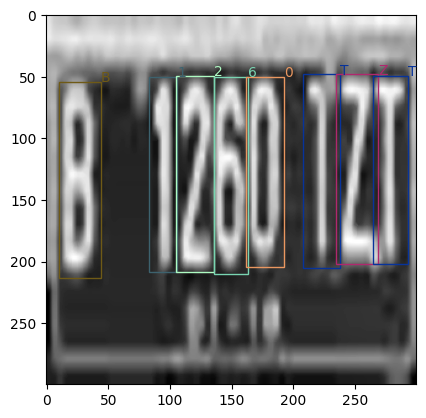

In [ ]:
tampil_bounding_box(combined_df,'/content/outputimg300300/outputimg300300/DataTrain266.png')

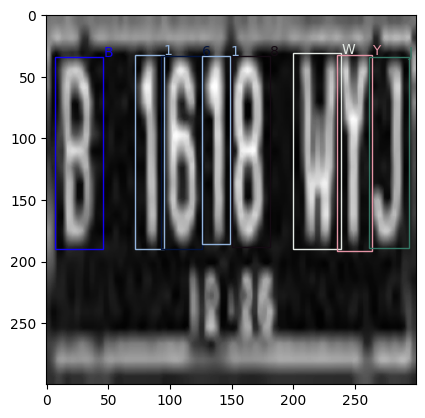

In [ ]:
tampil_bounding_box(combined_df,'/content/outputimg300300/outputimg300300/DataTrain16.png')

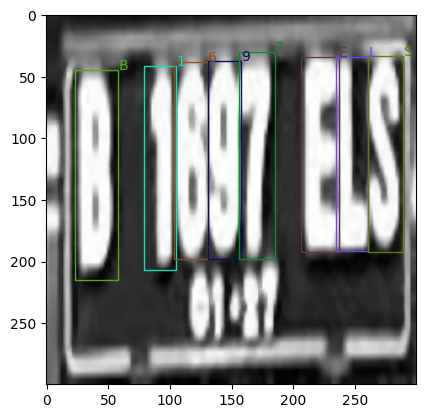

In [ ]:
tampil_bounding_box(combined_df,'/content/outputimg300300/outputimg300300/DataTrain20.png')

In [ ]:
# def segregate_data(df, img_path, label_path, train_img_path, train_label_path):
#   filenames = []
#   for filename in df.image:
#     filenames.append(filename)
#   filenames = set(filenames)

#   for filename in filenames:
#     yolo_list = []

#     for _,row in df[df.image == filename].iterrows():
#       yolo_list.append([row.labelasli, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

#     yolo_list = np.array(yolo_list)
#     txt_filename = os.path.join(train_label_path,str(row.image.split('.')[0])+".txt")
#     # Save the .img & .txt files to the corresponding train and validation folders
#     np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
#     shutil.copyfile(os.path.join(img_path,row.image), os.path.join(train_img_path,row.image))

In [ ]:
import os
import numpy as np

def convert_to_yolo_format(df, output_path):
    filenames = df['img'].unique()

    for filename in filenames:
        yolo_list = []
        df_filtered = df[df['img'] == filename]

        for _, row in df_filtered.iterrows():
            label = row['label']
            center_x = row['center_x']
            center_y = row['center_y']
            width = row['width']
            height = row['height']

            # Convert bounding box coordinates to YOLO format
            x = center_x / 300
            y = center_y / 300
            w = width / 300
            h = height / 300

            yolo_list.append([label, x, y, w, h])

        yolo_array = np.array(yolo_list)

        # Save the YOLO annotations to a text file
        txt_filename = os.path.join(output_path, os.path.splitext(filename)[0] + ".txt")
        np.savetxt(txt_filename, yolo_array, fmt=["%d", "%f", "%f", "%f", "%f"])

In [ ]:
combined_df

,label,center_x,center_y,width,height,img,labelasli,x,y,x2,y2
0,1,50.4999,109.5000,23.0001,137.0001,DataTrain207.png,B,38.99985,40.99995,61.99995,178.00005
1,27,109.5000,114.5001,17.0001,126.9999,DataTrain207.png,1,100.99995,51.00015,118.00005,178.00005
2,26,129.0000,117.0000,24.0000,128.0001,DataTrain207.png,0,117.00000,52.99995,141.00000,181.00005
3,28,150.5001,119.4999,23.0001,129.0000,DataTrain207.png,2,139.00005,54.99990,162.00015,183.99990
4,7,201.5001,128.4999,21.0000,131.0001,DataTrain207.png,H,191.00010,62.99985,212.00010,193.99995
...,...,...,...,...,...,...,...,...,...,...,...
4548,31,144.9999,73.5000,38.0001,69.0000,DataTrain574.png,5,125.99985,39.00000,163.99995,108.00000
4549,30,171.5001,89.4999,36.9999,71.0001,DataTrain574.png,4,153.00015,53.99985,190.00005,124.99995
4550,32,195.9999,99.5001,36.0000,66.9999,DataTrain574.png,6,177.99990,66.00015,213.99990,133.00005
4551,11,245.0001,130.5000,26.0001,81.0000,DataTrain574.png,L,232.00005,90.00000,258.00015,171.00000


In [ ]:
output_path = '/content/output300300/output300300'
convert_to_yolo_format(combined_df, output_path)

In [ ]:
import shutil
import os

source_images_folder = "/content/outputimg300300/outputimg300300"
source_labels_folder = "/content/output300300/output300300"
destination_folder = "/content/datamix4"
os.makedirs(destination_folder)
# Copy images
for filename in os.listdir(source_images_folder):
    shutil.copyfile(os.path.join(source_images_folder, filename), os.path.join(destination_folder, filename))

# Copy labels
for filename in os.listdir(source_labels_folder):
    shutil.copyfile(os.path.join(source_labels_folder, filename), os.path.join(destination_folder, filename))

In [ ]:
import zipfile

# Path folder yang akan di-zip
folder_path = '/content/datamix4'

# Nama file zip yang akan dihasilkan
zip_file_name = '/content/datamix4.zip'

# Membuat objek zip
zip_obj = zipfile.ZipFile(zip_file_name, 'w', zipfile.ZIP_DEFLATED)

# Menambahkan file-file dari folder ke dalam zip
for foldername, subfolders, filenames in os.walk(folder_path):
    for filename in filenames:
        file_path = os.path.join(foldername, filename)
        zip_obj.write(file_path, os.path.relpath(file_path, folder_path))

# Menutup objek zip
zip_obj.close()

print('Folder telah di-zip menjadi:', zip_file_name)

Folder telah di-zip menjadi: /content/datamix4.zip


In [ ]:
!git clone 'https://github.com/ultralytics/yolov5.git'

Cloning into 'yolov5'...
remote: Enumerating objects: 15996, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (96/96), done.
remote: Total 15996 (delta 101), reused 111 (delta 69), pack-reused 15831
Receiving objects: 100% (15996/15996), 14.64 MiB | 25.36 MiB/s, done.
Resolving deltas: 100% (10974/10974), done.


In [ ]:
!echo -e "train: /content/datamix4\nval: /content/datamix4\n\nnc: 36\nnames: ['A', 'B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z','0','1','2','3','4','5','6','7','8','9']" >> plat.yaml


In [ ]:
!cat 'plat.yaml'

train: /content/datamix4
val: /content/datamix4

nc: 36
names: ['A', 'B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z','0','1','2','3','4','5','6','7','8','9']


In [ ]:
import shutil
shutil.copyfile('/content/plat.yaml', '/content/yolov5/plat.yaml')

'/content/yolov5/plat.yaml'

In [ ]:
!sed -i 's/nc: 80/nc: 2/g' ./yolov5/models/yolov5l.yaml

In [ ]:
!pip install ultralytics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 14.9 MB/s eta 0:00:00


In [ ]:
len(os.listdir('/content/datamix4'))

1526

In [ ]:
file_path = 'classes.txt'  # Ganti dengan path yang sesuai dengan lokasi file classes.txt
for i in os.listdir('/content/datamix4'):
  if os.path.exists(os.path.join('/content/datamix4',file_path)):
      os.remove(os.path.join('/content/datamix4',file_path))
      print(f"File '{os.path.join('/content/datamix4',file_path)}' berhasil dihapus.")
  else:
      print(f"File '{os.path.join('/content/datamix4',file_path)}' tidak ditemukan.")

File '/content/datamix4/classes.txt' berhasil dihapus.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/classes.txt' tidak ditemukan.
File '/content/datamix4/cla

In [ ]:
len(os.listdir('/content/datamix4'))

1526

In [ ]:
!python yolov5/export.py --weights /content/drive/MyDrive/satriadata2023/all_1000epochs.pt --include tflite --img 300

export: data=yolov5/data/coco128.yaml, weights=['/content/drive/MyDrive/satriadata2023/all_1000epochs.pt'], imgsz=[300], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size 300 must be multiple of max stride 32, updating to 320
WARNING ⚠️ --img-size 300 must be multiple of max stride 32, updating to 320

PyTorch: starting from /content/drive/MyDrive/satriadata2023/all_1000epochs.pt with output shape (1, 6300, 41) (13.8 MB)

TensorFlow SavedModel: starting export with tensorflow 2.12.0...

                 from  n    params  module                                  arguments                     
2023-

In [ ]:
import shutil
source_folder = '/content/yolov5'

# Path tujuan di Google Drive
destination_folder = '/content/drive/MyDrive/satriadata2023/yolov5'

# Copy folder YOLOv5 ke Google Drive
shutil.copytree(source_folder, destination_folder)

# Unmount Google Drive setelah selesai
drive.flush_and_unmount()

In [ ]:
!python yolov5/train.py --img 300 --batch 64 --epochs 1000 --data=plat.yaml --cfg=yolov5/models/yolov5l.yaml --name plat_model

Streaming output truncated to the last 5000 lines.
      9/999      11.5G    0.07572    0.04792    0.07968        629        320: 100% 12/12 [00:10<00:00,  1.10it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 6/6 [00:09<00:00,  1.64s/it]
                   all        763       5788    0.00772      0.269     0.0075    0.00173

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     10/999      11.5G    0.07106    0.04754    0.07914        760        320: 100% 12/12 [00:11<00:00,  1.03it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 6/6 [00:10<00:00,  1.78s/it]
                   all        763       5788    0.00847      0.331     0.0115     0.0037

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
     11/999      11.5G    0.06923    0.04396    0.07838        688        320: 100% 12/12 [00:11<00:00,  1.04it/s]
                 Cla

In [ ]:
import shutil

# Tentukan path file asal dan tujuan
file_path = '/content/yolov5/runs/train/plat_model/weights/best.pt'
destination_folder = '/content/drive/MyDrive/satriadata2023/yolov5l'

# Lakukan proses copy file
shutil.copy2(file_path, destination_folder)

'/content/drive/MyDrive/satriadata2023/yolov5l/best.pt'

In [ ]:
file_path = '/content/yolov5/runs/train/plat_model2/weights/best.pt'
destination_folder = '/content/drive/MyDrive/satriadata2023/yolov5l'

# Lakukan proses copy file
shutil.copy2(file_path, destination_folder)

FileNotFoundError: ignored

In [ ]:
def decode_label(encoded_label):
    if 0 <= encoded_label <= 25:
        return chr(encoded_label + 65)  # Menambahkan 65 untuk mendapatkan karakter abjad kapital ASCII
    elif 26 <= encoded_label <= 35:
        return str(encoded_label - 26)  # Mengurangi 26 untuk mendapatkan angka ASCII

    return None  # Mengembalikan None jika label di luar rentang 0-35

def hitung_persentase_irisan(xa1, ya1, xa2, ya2, xb1, yb1, xb2, yb2):
    # hitung tinggi dan lebar masing-masing persegi panjang
    tinggi1 = abs(ya2 - ya1)
    tinggi2 = abs(yb2 - yb1)
    lebar1 = abs(xa2 - xa1)
    lebar2 = abs(xb2 - xb1)
    # fitung koordinat piksel sudut-sudut irisan
    x1 = max(xa1, xb1)
    y1 = max(ya1, yb1)
    x2 = min(xa2, xb2)
    y2 = min(ya2, yb2)
    # hitung tinggi dan lebar irisan
    tinggi_irisan = max(0, y2 - y1)
    lebar_irisan = max(0, x2 - x1)
    luas_irisan = tinggi_irisan * lebar_irisan
    luas_gabungan = (tinggi1 * lebar1) + (tinggi2 * lebar2) - luas_irisan
    persentase = luas_irisan / luas_gabungan
    return persentase

def med(path, thres=0.8):
    df = pd.read_csv(path, header=None, sep=' ')
    try:
        df.columns = ['label', 'center_x', 'center_y', 'width', 'height', 'conf']
    except:
        df.columns = ['label', 'center_x', 'center_y', 'width', 'height']

    med = np.median(df.height)
    ambil = df[df['height'] > 0.5 * med]

    ambil['x'] = (ambil['center_x'] - (ambil['width'] / 2))
    ambil['y'] = (ambil['center_y'] - (ambil['height'] / 2))
    ambil['x2'] = (ambil['center_x'] + (ambil['width'] / 2))
    ambil['y2'] = (ambil['center_y'] + (ambil['height'] / 2))
    ambil = ambil.sort_values('x', ascending=True).reset_index(drop=True)
    ambil['label_prediksi'] = ambil['label'].apply(decode_label)

    # Awalan
    if ambil['label_prediksi'][0] == 8:
        ambil['label_prediksi'][0] = 'B'

    # Hitung persentase irisan
    for i, row in ambil.iterrows():
        try:
            for j, row2 in ambil.iterrows():
                if i != j:
                    xa1 = row.x
                    xa2 = row.x2
                    ya1 = row.y
                    ya2 = row.y2

                    xb1 = row2.x
                    xb2 = row2.x2
                    yb1 = row2.y
                    yb2 = row2.y2
                    persentase = hitung_persentase_irisan(xa1, ya1, xa2, ya2, xb1, yb1, xb2, yb2)
                    # print(f'persentase luas irisan label {row.label_prediksi} dengan label {row2.label_prediksi} adalah : {persentase}')
                    if persentase > thres:
                        if ambil['conf'][i] > ambil['conf'][j]:
                            ambil.drop(j, inplace=True)
                            print('berhasil dihapus')
                        elif ambil['conf'][i] < ambil['conf'][j]:
                            ambil.drop(i, inplace=True)
                            print('berhasil dihapus')
                        else:
                            ambil.drop(j, inplace=True)
        except:
            pass
    no_plat = list(ambil['label_prediksi'].values)
    for i in range(len(no_plat)):
      try:
        no_plat[i] = int(no_plat[i])
      except:
        pass
    if type(no_plat[0]) == np.int:
      no_plat.insert(0, 'B')
    print('no plat: ',no_plat)
    return ambil


# 500 epoch all data train

detect: weights=['/content/yolov5/runs/train/plat_model/weights/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest46.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients, 16.1 GFLOPs
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest46.png: 160x320 1 B, 1 P, 1 W, 1 Y, 1 1, 1 2, 1 4, 1 7, 40.4ms
Speed: 0.3ms pre-process, 40.4ms inference, 1.6ms NMS per image at shape

<ipython-input-38-c13c3c753434>:82: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if type(no_plat[0]) == np.int:


no plat:  ['B', 1, 7, 2, 4, 'P', 'Y', 'W']


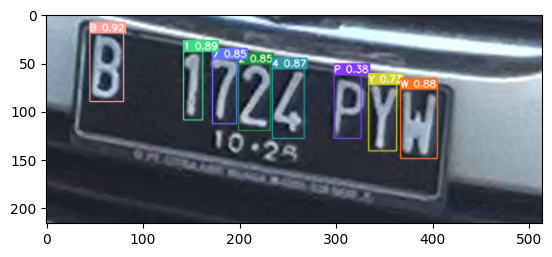

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
img = 'DataTest46'
i = ''
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/{img}.png --imgsz 300 --weights '/content/yolov5/runs/train/plat_model/weights/best.pt' --line-thickness 1 --save-txt --save-conf
med(f'/content/yolov5/runs/detect/exp{i}/labels/{img}.txt')
obj = f'/content/yolov5/runs/detect/exp{i}/{img}.png'
plt.imshow(imread(obj))
plt.show()


detect: weights=['/content/yolov5/runs/train/plat_model/weights/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest23.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients, 16.1 GFLOPs
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest23.png: 96x320 1 A, 1 B, 1 E, 37.6ms
Speed: 0.2ms pre-process, 37.6ms inference, 1.4ms NMS per image at shape (1, 3, 320, 320)
Results 

<ipython-input-38-c13c3c753434>:82: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if type(no_plat[0]) == np.int:


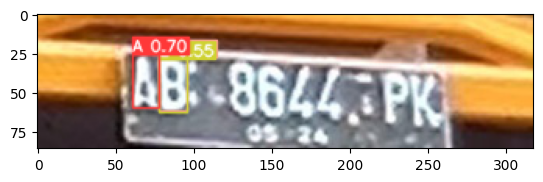

In [ ]:

img = 'DataTest23'
i = 3
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/{img}.png --imgsz 300 --weights '/content/yolov5/runs/train/plat_model/weights/best.pt' --line-thickness 1 --save-txt --save-conf
med(f'/content/yolov5/runs/detect/exp{i}/labels/{img}.txt')
obj = f'/content/yolov5/runs/detect/exp{i}/{img}.png'
plt.imshow(imread(obj))
plt.show()


detect: weights=['/content/yolov5/runs/train/plat_model/weights/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest51.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients, 16.1 GFLOPs
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest51.png: 128x320 1 B, 1 J, 1 T, 1 U, 1 1, 1 6, 2 7s, 1 8, 40.3ms
Speed: 0.2ms pre-process, 40.3ms inference, 1.5ms NMS per image at shap

<ipython-input-38-c13c3c753434>:82: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if type(no_plat[0]) == np.int:


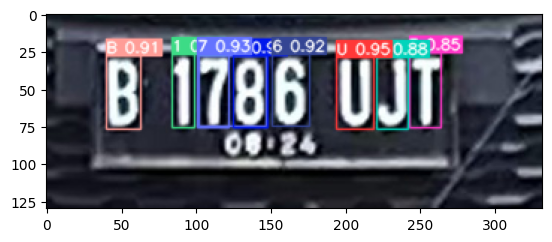

In [ ]:

img = 'DataTest51'
i = 4
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/{img}.png --imgsz 300 --weights '/content/yolov5/runs/train/plat_model/weights/best.pt' --line-thickness 1 --save-txt --save-conf
med(f'/content/yolov5/runs/detect/exp{i}/labels/{img}.txt')
obj = f'/content/yolov5/runs/detect/exp{i}/{img}.png'
plt.imshow(imread(obj))
plt.show()


# Selesai

In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest46.png --imgsz 300 --weights '/content/yolov5/runs/train/plat_model23/weights/best_1100.pt' --line-thickness 1 --save-txt --save-conf

detect: weights=['/content/yolov5/runs/train/plat_model23/weights/best_1100.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest46.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients, 16.1 GFLOPs
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest46.png: 160x320 1 B, 1 P, 1 R, 1 W, 1 Y, 1 1, 1 2, 1 4, 1 7, 69.6ms
Speed: 0.4ms pre-process, 69.6ms inference, 2.2m

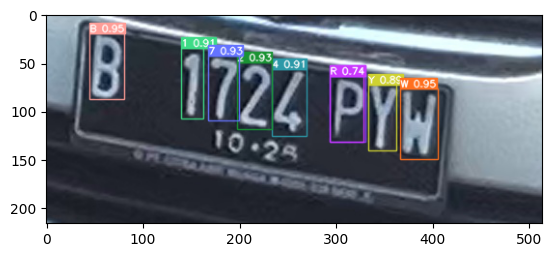

In [ ]:
import matplotlib.pyplot as plt
pred = '/content/yolov5/runs/detect/exp2/DataTest46.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

In [ ]:
med('/content/yolov5/runs/detect/exp2/labels/DataTest46.txt')

,label,center_x,center_y,width,height,conf,x,y,x2,y2,labelasli
0,1,0.122568,0.250000,0.070039,0.314815,0.951034,0.087549,0.092592,0.157587,0.407408,B
1,27,0.294747,0.331019,0.044747,0.337963,0.913979,0.272373,0.162038,0.317121,0.500001,1
2,33,0.357977,0.354167,0.062257,0.310185,0.930327,0.326849,0.199075,0.389105,0.509259,7
3,28,0.420233,0.391204,0.070039,0.319444,0.926072,0.385214,0.231482,0.455252,0.550926,2
4,30,0.490272,0.423611,0.070039,0.319444,0.906803,0.455253,0.263889,0.525291,0.583333,4
5,17,0.606031,0.453704,0.068093,0.314815,0.740289,0.571984,0.296296,0.640078,0.611112,R
6,15,0.607977,0.453704,0.071984,0.314815,0.459964,0.571985,0.296296,0.643969,0.611112,P
7,24,0.678016,0.495370,0.056420,0.314815,0.891684,0.649806,0.337962,0.706226,0.652778,Y
8,22,0.751945,0.525463,0.075875,0.337963,0.946909,0.714007,0.356482,0.789883,0.694445,W


detect: weights=['/content/yolov5/runs/train/plat_model23/weights/best_1100.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest23.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients, 16.1 GFLOPs
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest23.png: 96x320 1 A, 1 B, 2 4s, 2 6s, 41.6ms
Speed: 0.3ms pre-process, 41.6ms inference, 1.6ms NMS per image at shape

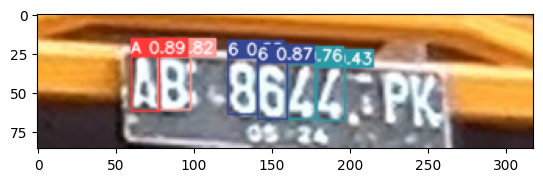

,label,center_x,center_y,width,height,conf,x,y,x2,y2,labelasli
0,0,0.216981,0.517442,0.056604,0.406977,0.891831,0.188679,0.313953,0.245283,0.720930,A
1,1,0.275157,0.511628,0.066038,0.395349,0.818210,0.242138,0.313953,0.308176,0.709302,B
2,32,0.413522,0.534884,0.059748,0.418605,0.550520,0.383648,0.325582,0.443396,0.744187,6
3,32,0.473270,0.569767,0.059748,0.418605,0.872359,0.443396,0.360465,0.503144,0.779070,6
4,30,0.531447,0.575581,0.056604,0.406977,0.764965,0.503145,0.372093,0.559749,0.779069,4
5,30,0.591195,0.593023,0.056604,0.395349,0.429221,0.562893,0.395348,0.619497,0.790697,4


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest23.png --imgsz 300 --weights '/content/yolov5/runs/train/plat_model23/weights/best_1100.pt' --line-thickness 1 --save-txt --save-conf
pred = '/content/yolov5/runs/detect/exp3/DataTest23.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp3/labels/DataTest23.txt')

detect: weights=['/content/yolov5/runs/train/plat_model23/weights/best_1100.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest51.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients, 16.1 GFLOPs
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest51.png: 128x320 1 B, 1 J, 2 Ts, 1 U, 1 1, 1 6, 1 7, 1 8, 47.2ms
Speed: 0.3ms pre-process, 47.2ms inference, 1.9ms NM

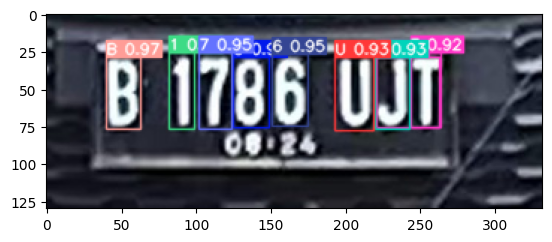

,label,center_x,center_y,width,height,conf,x,y,x2,y2,labelasli
0,1,0.155120,0.407692,0.069277,0.369231,0.973252,0.120481,0.223077,0.189759,0.592307,B
1,27,0.272590,0.396154,0.051205,0.392308,0.942523,0.246988,0.200000,0.298192,0.592308,1
2,33,0.340361,0.396154,0.066265,0.392308,0.948319,0.307228,0.200000,0.373494,0.592308,7
3,34,0.412651,0.403846,0.072289,0.361538,0.911223,0.376506,0.223077,0.448796,0.584615,8
4,32,0.490964,0.392308,0.072289,0.369231,0.947805,0.454819,0.207693,0.527109,0.576923,6
5,20,0.620482,0.411538,0.078313,0.376923,0.931058,0.581325,0.223077,0.659639,0.600000,U
6,9,0.697289,0.407692,0.069277,0.369231,0.928846,0.662650,0.223077,0.731928,0.592307,J
7,19,0.728916,0.403846,0.126506,0.361538,0.261304,0.665663,0.223077,0.792169,0.584615,T
8,19,0.765060,0.392308,0.060241,0.384615,0.921369,0.734939,0.200000,0.795180,0.584615,T


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest51.png --imgsz 300 --weights '/content/yolov5/runs/train/plat_model23/weights/best_1100.pt' --line-thickness 1 --save-txt --save-conf
pred = '/content/yolov5/runs/detect/exp4/DataTest51.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp4/labels/DataTest51.txt')

In [ ]:
DataTest23

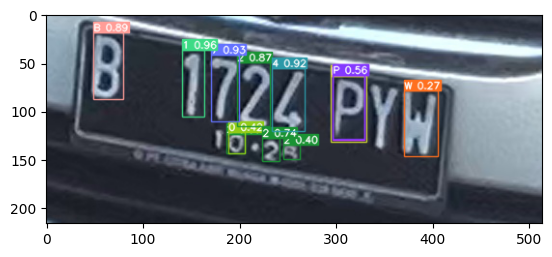

In [ ]:
import matplotlib.pyplot as plt
pred = '/content/yolov5/runs/detect/exp/DataTest46.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

In [ ]:
dt46 = pd.read_csv('/content/yolov5/runs/detect/exp/labels/DataTest46.txt',header=None, sep=' ')
dt46.columns = ['label'	,'center_x',	'center_y',	'width'	,'height']
dt46

,label,center_x,center_y,width,height
0,22,0.755837,0.523148,0.068093,0.314815
1,4,0.609922,0.453704,0.071984,0.314815
2,28,0.382296,0.620370,0.036965,0.092593
3,28,0.495136,0.659722,0.033074,0.069444
4,26,0.384241,0.615741,0.033074,0.101852
5,17,0.609922,0.446759,0.064202,0.310185
6,15,0.609922,0.444444,0.064202,0.305556
7,28,0.453307,0.648148,0.035020,0.111111
8,28,0.418288,0.384259,0.066148,0.305556
9,1,0.125486,0.247685,0.060311,0.319444


In [ ]:
def decode_label(encoded_label):
    if 0 <= encoded_label <= 25:
        return chr(encoded_label + 65)  # Menambahkan 65 untuk mendapatkan karakter abjad kapital ASCII
    elif 26 <= encoded_label <= 35:
        return str(encoded_label - 26)  # Mengurangi 26 untuk mendapatkan angka ASCII

    return None  # Mengembalikan None jika label di luar rentang 0-35

In [ ]:
combined_df['x'] = (combined_df['center_x']-(combined_df['width']/2))
combined_df['y'] = (combined_df['center_y']-(combined_df['height']/2))
combined_df['x2'] = (combined_df['center_x']+(combined_df['width']/2))
combined_df['y2'] = (combined_df['center_y']+(combined_df['height']/2))

In [ ]:
def med(path):
  df = pd.read_csv(path,header=None, sep=' ')
  df.columns = ['label'	,'center_x',	'center_y',	'width'	,'height','conf']
  med = np.median(df.height)
  ambil = df[df['height']>0.5*med]

  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
  ambil['x2'] = (ambil['center_x']+(ambil['width']/2))
  ambil['y2'] = (ambil['center_y']+(ambil['height']/2))
  ambil = ambil.sort_values('x',ascending=True).reset_index(drop=True)
  ambil['labelasli'] = ambil['label'].apply(decode_label)
  # awalan
  if ambil['labelasli'][0]==8:
    ambil['labelasli'][0] = 'B'

  return ambil



In [ ]:
med('/content/yolov5/runs/detect/exp/labels/DataTest46.txt')

<ipython-input-42-30b961cb6ab1>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-42-30b961cb6ab1>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-42-30b961cb6ab1>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.125486,0.247685,0.060311,0.319444,0.095330,0.087963,0.155642,0.407407,B
1,27,0.296693,0.331019,0.044747,0.319444,0.274319,0.171297,0.319067,0.490741,1
2,33,0.360895,0.354167,0.056420,0.319444,0.332685,0.194445,0.389105,0.513889,7
3,28,0.418288,0.384259,0.066148,0.305556,0.385214,0.231481,0.451362,0.537037,2
4,30,0.488327,0.409722,0.066148,0.300926,0.455253,0.259259,0.521401,0.560185,4
5,4,0.609922,0.453704,0.071984,0.314815,0.573930,0.296296,0.645914,0.611112,E
6,17,0.609922,0.446759,0.064202,0.310185,0.577821,0.291667,0.642023,0.601851,R
7,15,0.609922,0.444444,0.064202,0.305556,0.577821,0.291666,0.642023,0.597222,P
8,22,0.755837,0.523148,0.068093,0.314815,0.721790,0.365740,0.789884,0.680555,W


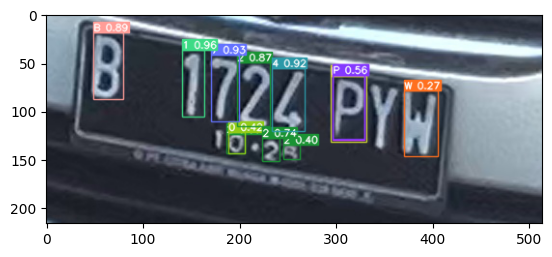

In [ ]:
import matplotlib.pyplot as plt
pred = '/content/yolov5/runs/detect/exp/DataTest46.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

In [ ]:
np.median

<function numpy.median(a, axis=None, out=None, overwrite_input=False, keepdims=False)>

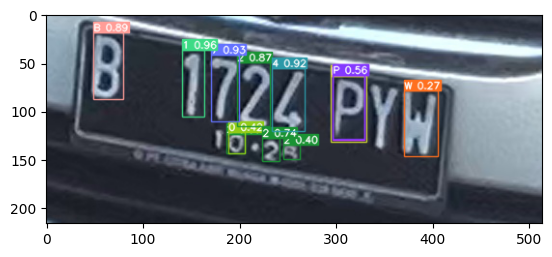

In [ ]:
import matplotlib.pyplot as plt
pred = '/content/yolov5/runs/detect/exp4/DataTest46.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

In [ ]:
# import os
# print(os.getcwd())
# print(os.listdir('runs/train/plat_model/'))
# from google.colab import files
# files.download('/content/yolov5/runs/train/plat_model/weights/best.pt')

* ------------------

In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest87.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest87.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest87.png: 96x320 2 Bs, 2 Fs, 1 R, 3 0s, 2 1s, 1 3, 1 5, 3 9s, 48.4ms
Speed: 0.4ms pre-process, 48.4ms inference, 2.7ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp3
1 labe

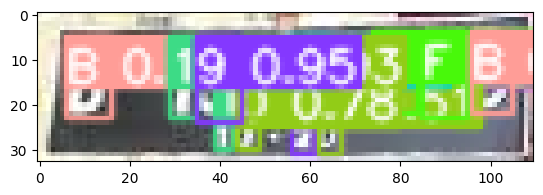

In [ ]:
pred = '/content/yolov5/runs/detect/exp3/DataTest87.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

In [ ]:
med('/content/yolov5/runs/detect/exp3/labels/DataTest87.txt')

<ipython-input-42-30b961cb6ab1>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-42-30b961cb6ab1>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-42-30b961cb6ab1>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.100000,0.424242,0.090909,0.545455,0.054545,0.151514,0.145455,0.696970,B
1,27,0.290909,0.424242,0.054545,0.545455,0.263636,0.151514,0.318182,0.696970,1
2,35,0.363636,0.439394,0.090909,0.575758,0.318181,0.151515,0.409091,0.727273,9
3,26,0.450000,0.424242,0.081818,0.545455,0.409091,0.151514,0.490909,0.696970,0
4,29,0.540909,0.439394,0.081818,0.515152,0.500000,0.181818,0.581818,0.696970,3
5,31,0.540909,0.439394,0.081818,0.575758,0.500000,0.151515,0.581818,0.727273,5
6,17,0.718182,0.409091,0.090909,0.515152,0.672727,0.151515,0.763637,0.666667,R
7,5,0.718182,0.393939,0.090909,0.545455,0.672727,0.121211,0.763637,0.666667,F
8,5,0.818182,0.409091,0.090909,0.575758,0.772727,0.121212,0.863637,0.696970,F
9,1,0.913636,0.393939,0.081818,0.545455,0.872727,0.121211,0.954545,0.666667,B


detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest80.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest80.png: 128x320 1 B, 2 Es, 2 1s, 2 5s, 1 9, 83.0ms
Speed: 0.3ms pre-process, 83.0ms inference, 1.6ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp5
1 labels saved to yolo

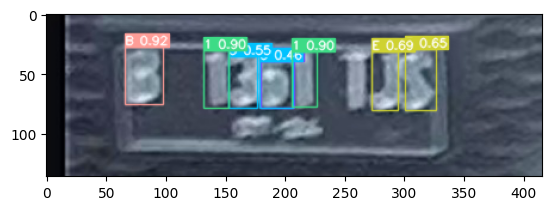

In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest80.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp5/DataTest80.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

In [ ]:
med('/content/yolov5/runs/detect/exp5/labels/DataTest80.txt')

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.197115,0.382353,0.076923,0.352941,0.158653,0.205882,0.235577,0.558824,B
1,27,0.342548,0.404412,0.050481,0.352941,0.317308,0.227941,0.367788,0.580882,1
2,31,0.396635,0.422794,0.057692,0.316176,0.367789,0.264706,0.425481,0.580882,5
3,31,0.463942,0.437500,0.067308,0.286765,0.430288,0.294118,0.497596,0.580882,5
4,35,0.466346,0.437500,0.067308,0.286765,0.432692,0.294118,0.500000,0.580882,9
5,27,0.520433,0.404412,0.050481,0.338235,0.495193,0.235294,0.545673,0.573530,1
6,4,0.682692,0.415441,0.052885,0.360294,0.656250,0.235294,0.709134,0.595588,E
7,4,0.754808,0.408088,0.062500,0.375000,0.723558,0.220588,0.786058,0.595588,E


detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest91.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest91.png: 128x320 1 B, 1 E, 1 M, 1 S, 1 1, 1 3, 2 4s, 2 5s, 1 6, 1 9, 63.0ms
Speed: 0.4ms pre-process, 63.0ms inference, 1.8ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp

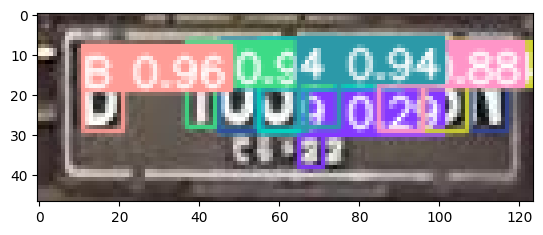

<ipython-input-45-98a28ee81623>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-45-98a28ee81623>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-45-98a28ee81623>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.129032,0.393617,0.080645,0.446809,0.088709,0.170212,0.169355,0.617022,B
1,27,0.326613,0.372340,0.056452,0.446809,0.298387,0.148935,0.354839,0.595745,1
2,31,0.403226,0.382979,0.080645,0.468085,0.362903,0.148937,0.443549,0.617022,5
3,32,0.403226,0.382979,0.080645,0.468085,0.362903,0.148937,0.443549,0.617022,6
4,30,0.491935,0.382979,0.096774,0.468085,0.443548,0.148937,0.540322,0.617022,4
5,31,0.483871,0.382979,0.080645,0.468085,0.443548,0.148937,0.524194,0.617022,5
6,29,0.483871,0.382979,0.080645,0.468085,0.443548,0.148937,0.524194,0.617022,3
7,30,0.564516,0.361702,0.080645,0.468085,0.524193,0.127660,0.604839,0.595745,4
8,18,0.729839,0.382979,0.088710,0.468085,0.685484,0.148937,0.774194,0.617022,S
9,4,0.818548,0.382979,0.088710,0.468085,0.774193,0.148937,0.862903,0.617022,E


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest91.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp6/DataTest91.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp6/labels/DataTest91.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest63.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest63.png: 160x320 1 B, 1 K, 1 T, 4 0s, 2 1s, 1 4, 1 5, 1 6, 1 7, 106.1ms
Speed: 0.4ms pre-process, 106.1ms inference, 1.6ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp9
1

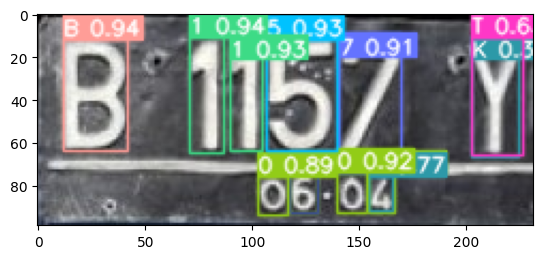

<ipython-input-45-98a28ee81623>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-45-98a28ee81623>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-45-98a28ee81623>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.116379,0.383838,0.129310,0.525253,0.051724,0.121212,0.181034,0.646464,B
1,27,0.340517,0.383838,0.068965,0.545455,0.306034,0.111111,0.375000,0.656566,1
2,27,0.420259,0.373737,0.064655,0.545455,0.387931,0.101009,0.452587,0.646464,1
3,31,0.532328,0.383838,0.142241,0.525253,0.461207,0.121212,0.603449,0.646464,5
4,33,0.670259,0.383838,0.125000,0.585859,0.607759,0.090909,0.732759,0.676767,7
5,19,0.926724,0.388889,0.103448,0.555556,0.875000,0.111111,0.978448,0.666667,T
6,10,0.922414,0.388889,0.094828,0.575758,0.875000,0.101010,0.969828,0.676768,K


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest63.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp9/DataTest63.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp9/labels/DataTest63.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest62.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest62.png: 160x320 1 A, 1 D, 1 0, 2 1s, 1 4, 1 6, 64.4ms
Speed: 0.3ms pre-process, 64.4ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp10
1 labels saved to 

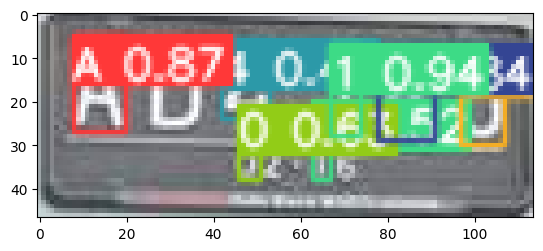

<ipython-input-45-98a28ee81623>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-45-98a28ee81623>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-45-98a28ee81623>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.122807,0.340426,0.105263,0.468085,0.070176,0.106384,0.175438,0.574469,A
1,30,0.416667,0.319149,0.096491,0.382979,0.368421,0.127660,0.464913,0.510638,4
2,27,0.618421,0.372340,0.061403,0.446809,0.587719,0.148935,0.649123,0.595745,1
3,32,0.741228,0.382979,0.114035,0.468085,0.684211,0.148937,0.798245,0.617022,6
4,3,0.894737,0.404255,0.087719,0.468085,0.850877,0.170212,0.938597,0.638297,D


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest62.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp10/DataTest62.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp10/labels/DataTest62.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest57.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest57.png: 96x320 2 As, 1 0, 1 1, 1 2, 1 6, 1 7, 1 8, 49.8ms
Speed: 0.3ms pre-process, 49.8ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp11
1 labels saved

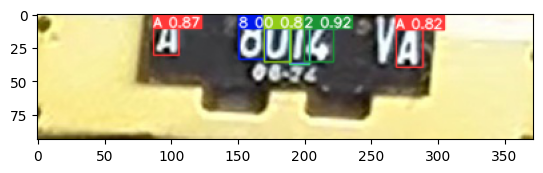

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.259409,0.164894,0.051075,0.329787,0.233871,5.000000e-07,0.284947,0.329788,A
1,32,0.432796,0.180851,0.053763,0.361702,0.405914,0.000000e+00,0.459678,0.361702,6
2,34,0.432796,0.180851,0.053763,0.361702,0.405914,0.000000e+00,0.459678,0.361702,8
3,26,0.483871,0.191489,0.053763,0.382979,0.456989,-5.000000e-07,0.510753,0.382978,0
4,33,0.528226,0.196809,0.040323,0.393617,0.508065,5.000000e-07,0.548387,0.393618,7
5,27,0.528226,0.202128,0.040323,0.404255,0.508065,5.000000e-07,0.548387,0.404255,1
6,28,0.567204,0.191489,0.059140,0.382979,0.537634,-5.000000e-07,0.596774,0.382978,2
7,0,0.750000,0.218085,0.053763,0.414894,0.723118,1.063800e-02,0.776882,0.425532,A


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest57.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp11/DataTest57.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp11/labels/DataTest57.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest46.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest46.png: 160x320 1 B, 1 E, 1 P, 1 R, 1 W, 1 0, 1 1, 4 2s, 1 4, 1 7, 74.0ms
Speed: 0.3ms pre-process, 74.0ms inference, 1.6ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp1

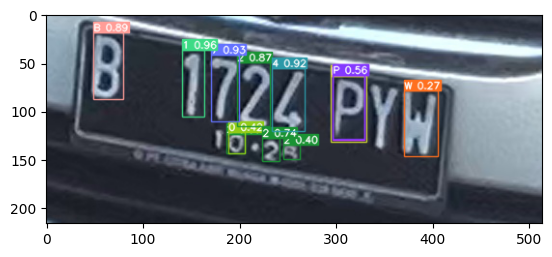

<ipython-input-45-98a28ee81623>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-45-98a28ee81623>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-45-98a28ee81623>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.125486,0.247685,0.060311,0.319444,0.095330,0.087963,0.155642,0.407407,B
1,27,0.296693,0.331019,0.044747,0.319444,0.274319,0.171297,0.319067,0.490741,1
2,33,0.360895,0.354167,0.056420,0.319444,0.332685,0.194445,0.389105,0.513889,7
3,28,0.418288,0.384259,0.066148,0.305556,0.385214,0.231481,0.451362,0.537037,2
4,30,0.488327,0.409722,0.066148,0.300926,0.455253,0.259259,0.521401,0.560185,4
5,4,0.609922,0.453704,0.071984,0.314815,0.573930,0.296296,0.645914,0.611112,E
6,17,0.609922,0.446759,0.064202,0.310185,0.577821,0.291667,0.642023,0.601851,R
7,15,0.609922,0.444444,0.064202,0.305556,0.577821,0.291666,0.642023,0.597222,P
8,22,0.755837,0.523148,0.068093,0.314815,0.721790,0.365740,0.789884,0.680555,W


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest46.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp12/DataTest46.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp12/labels/DataTest46.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest34.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest34.png: 192x320 1 B, 1 D, 1 V, 2 1s, 1 2, 1 4, 1 6, 2 9s, 121.5ms
Speed: 0.4ms pre-process, 121.5ms inference, 1.6ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp13
1 lab

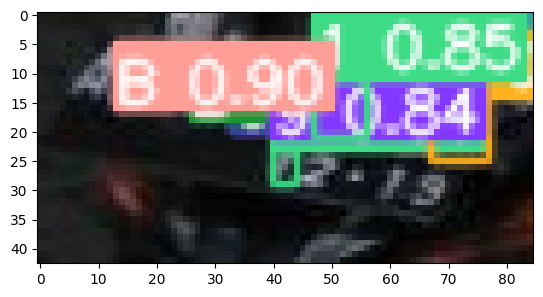

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.211765,0.244186,0.117647,0.255814,0.152942,0.116279,0.270589,0.372093,B
1,28,0.358824,0.279070,0.105882,0.232558,0.305883,0.162791,0.411765,0.395349,2
2,35,0.452941,0.325581,0.129412,0.232558,0.388235,0.209302,0.517647,0.441860,9
3,32,0.435294,0.325581,0.094118,0.232558,0.388235,0.209302,0.482353,0.441860,6
4,35,0.523529,0.348837,0.105882,0.232558,0.470588,0.232558,0.576470,0.465116,9
5,27,0.494118,0.604651,0.047059,0.139535,0.470589,0.534884,0.517647,0.674419,1
6,27,0.605882,0.372093,0.105882,0.232558,0.552941,0.255814,0.658823,0.488372,1
7,30,0.611765,0.383721,0.094118,0.255814,0.564706,0.255814,0.658824,0.511628,4
8,21,0.764706,0.418605,0.094118,0.232558,0.717647,0.302326,0.811765,0.534884,V
9,3,0.847059,0.453488,0.117647,0.255814,0.788235,0.325581,0.905883,0.581395,D


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest34.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp13/DataTest34.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp13/labels/DataTest34.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest26.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest26.png: 192x320 1 B, 2 Es, 1 S, 3 1s, 1 3, 1 9, 74.3ms
Speed: 0.3ms pre-process, 74.3ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp14
1 labels saved to

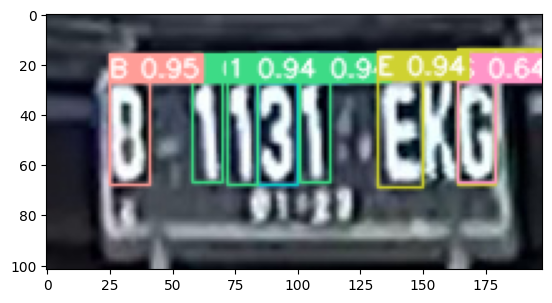

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.166667,0.465686,0.080808,0.401961,0.126263,0.264705,0.207071,0.666667,B
1,27,0.323232,0.460784,0.060606,0.392157,0.292929,0.264706,0.353535,0.656863,1
2,27,0.393939,0.465686,0.060606,0.401961,0.363636,0.264705,0.424242,0.666667,1
3,35,0.464646,0.465686,0.080808,0.401961,0.424242,0.264705,0.505050,0.666667,9
4,29,0.464646,0.465686,0.080808,0.401961,0.424242,0.264705,0.505050,0.666667,3
5,27,0.540404,0.460784,0.060606,0.392157,0.510101,0.264706,0.570707,0.656863,1
6,4,0.712121,0.465686,0.090909,0.421569,0.666666,0.254902,0.757576,0.676470,E
7,4,0.866162,0.455882,0.075758,0.421569,0.828283,0.245097,0.904041,0.666667,E
8,18,0.866162,0.460784,0.075758,0.392157,0.828283,0.264706,0.904041,0.656863,S


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest26.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp14/DataTest26.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp14/labels/DataTest26.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest17.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest17.png: 128x320 1 B, 1 D, 1 J, 1 Z, 2 0s, 1 1, 4 2s, 1 4, 2 9s, 52.9ms
Speed: 0.3ms pre-process, 52.9ms inference, 1.3ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp15
1

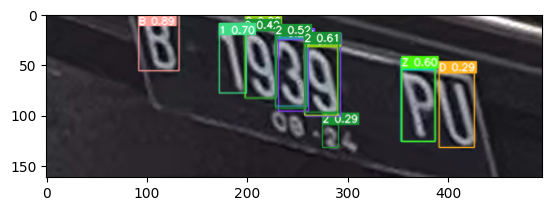

<ipython-input-45-98a28ee81623>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-45-98a28ee81623>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-45-98a28ee81623>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.226721,0.172840,0.080972,0.345679,0.186235,5.000000e-07,0.267207,0.345680,B
1,27,0.375506,0.268519,0.054656,0.425926,0.348178,5.555600e-02,0.402834,0.481482,1
2,28,0.431174,0.305556,0.064777,0.413580,0.398785,9.876600e-02,0.463563,0.512346,2
3,26,0.432186,0.293210,0.062753,0.438272,0.400810,7.407400e-02,0.463562,0.512346,0
4,30,0.493927,0.354938,0.064777,0.413580,0.461538,1.481480e-01,0.526316,0.561728,4
5,28,0.492915,0.351852,0.062753,0.444444,0.461538,1.296300e-01,0.524292,0.574074,2
6,35,0.497976,0.373457,0.060729,0.438272,0.467612,1.543210e-01,0.528340,0.592593,9
7,28,0.554656,0.388889,0.068826,0.419753,0.520243,1.790125e-01,0.589069,0.598765,2
8,26,0.553644,0.407407,0.066802,0.419753,0.520243,1.975305e-01,0.587045,0.617283,0
9,35,0.557692,0.404321,0.070850,0.438272,0.522267,1.851850e-01,0.593117,0.623457,9


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest17.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp15/DataTest17.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp15/labels/DataTest17.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest10.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest10.png: 128x320 1 B, 2 Es, 1 1, 2 5s, 1 7, 53.0ms
Speed: 0.3ms pre-process, 53.0ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp16
1 labels saved to yolo

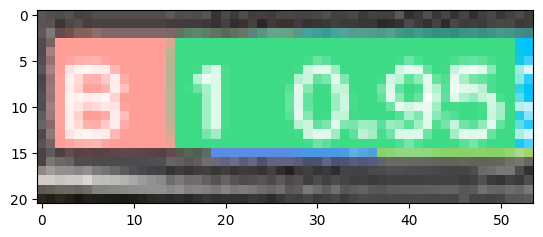

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.074074,0.357143,0.074074,0.428571,0.037037,0.142857,0.111111,0.571429,B
1,27,0.305556,0.357143,0.055556,0.428571,0.277778,0.142857,0.333334,0.571429,1
2,33,0.388889,0.380952,0.074074,0.380952,0.351852,0.190476,0.425926,0.571428,7
3,31,0.462963,0.357143,0.074074,0.428571,0.425926,0.142857,0.500000,0.571429,5
4,4,0.472222,0.357143,0.055556,0.428571,0.444444,0.142857,0.500000,0.571429,E
5,31,0.564815,0.357143,0.092593,0.428571,0.518519,0.142857,0.611111,0.571429,5
6,4,0.731481,0.380952,0.092593,0.380952,0.685185,0.190476,0.777777,0.571428,E


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest10.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp16/DataTest10.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp16/labels/DataTest10.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest15.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest15.png: 192x320 1 B, 1 S, 1 T, 1 Z, 1 0, 2 1s, 1 6, 1 8, 1 9, 131.7ms
Speed: 0.5ms pre-process, 131.7ms inference, 1.8ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp17
1

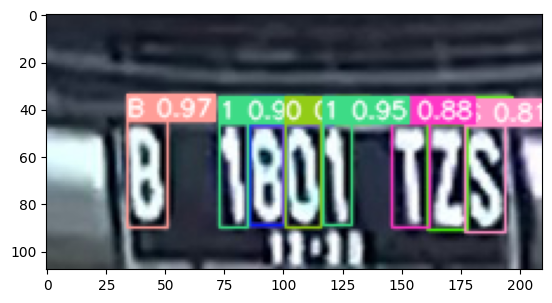

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.202381,0.625000,0.080952,0.416667,0.161905,0.416666,0.242857,0.833333,B
1,27,0.376190,0.629630,0.057143,0.407407,0.347619,0.425926,0.404761,0.833334,1
2,35,0.440476,0.629630,0.071429,0.388889,0.404762,0.435186,0.476190,0.824075,9
3,32,0.442857,0.629630,0.076190,0.388889,0.404762,0.435186,0.480952,0.824075,6
4,34,0.445238,0.625000,0.071429,0.398148,0.409524,0.425926,0.480952,0.824074,8
5,26,0.516667,0.629630,0.071429,0.407407,0.480953,0.425926,0.552381,0.833334,0
6,27,0.585714,0.625000,0.057143,0.398148,0.557143,0.425926,0.614285,0.824074,1
7,19,0.733333,0.629630,0.076190,0.407407,0.695238,0.425926,0.771428,0.833334,T
8,25,0.807143,0.634259,0.080952,0.416667,0.766667,0.425926,0.847619,0.842593,Z
9,18,0.883333,0.643519,0.080952,0.416667,0.842857,0.435185,0.923809,0.851852,S


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest15.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp17/DataTest15.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp17/labels/DataTest15.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest11.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest11.png: 128x320 2 Bs, 2 Es, 1 T, 3 1s, 1 2, 1 5, 54.9ms
Speed: 0.3ms pre-process, 54.9ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp18
1 labels saved t

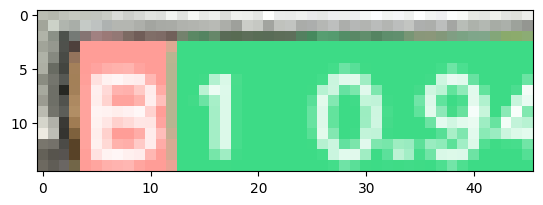

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.119565,0.466667,0.065217,0.533333,0.086956,0.200001,0.152174,0.733333,B
1,4,0.108696,0.500000,0.043478,0.466667,0.086957,0.266667,0.130435,0.733333,E
2,27,0.315217,0.466667,0.065217,0.533333,0.282608,0.200001,0.347826,0.733333,1
3,31,0.391304,0.466667,0.086957,0.400000,0.347826,0.266667,0.434782,0.666667,5
4,28,0.489130,0.466667,0.065217,0.400000,0.456521,0.266667,0.521739,0.666667,2
5,27,0.565217,0.466667,0.086957,0.533333,0.521739,0.200001,0.608695,0.733333,1
6,1,0.771739,0.433333,0.065217,0.466667,0.739130,0.200000,0.804348,0.666667,B
7,19,0.858696,0.433333,0.065217,0.466667,0.826087,0.200000,0.891305,0.666667,T
8,27,0.858696,0.466667,0.065217,0.533333,0.826087,0.200001,0.891305,0.733333,1
9,4,0.945652,0.433333,0.065217,0.466667,0.913043,0.200000,0.978261,0.666667,E


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest11.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp18/DataTest11.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp18/labels/DataTest11.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest23.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest23.png: 96x320 1 A, 5 Bs, 1 E, 2 4s, 1 8, 43.4ms
Speed: 0.2ms pre-process, 43.4ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp19
1 labels saved to yolov

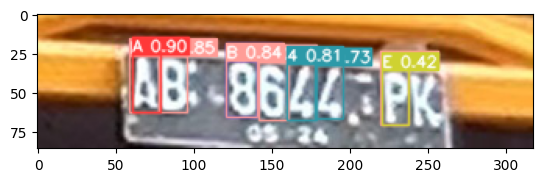

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.215409,0.523256,0.059748,0.418605,0.185535,0.313954,0.245283,0.732559,B
1,0,0.220126,0.517442,0.056604,0.430233,0.191824,0.302325,0.248428,0.732558,A
2,1,0.273585,0.523256,0.056604,0.418605,0.245283,0.313954,0.301887,0.732559,B
3,34,0.411950,0.558140,0.062893,0.418605,0.380503,0.348837,0.443397,0.767443,8
4,1,0.411950,0.558140,0.062893,0.418605,0.380503,0.348837,0.443397,0.767443,B
5,1,0.476415,0.575581,0.059748,0.430233,0.446541,0.360465,0.506289,0.790698,B
6,30,0.533019,0.581395,0.059748,0.418605,0.503145,0.372092,0.562893,0.790698,4
7,30,0.588050,0.581395,0.056604,0.395349,0.559748,0.383721,0.616352,0.779069,4
8,1,0.720126,0.616279,0.056604,0.418605,0.691824,0.406977,0.748428,0.825581,B
9,4,0.721698,0.622093,0.053459,0.406977,0.694968,0.418605,0.748428,0.825581,E


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest23.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp19/DataTest23.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp19/labels/DataTest23.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest3.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest3.png: 128x320 2 Bs, 2 0s, 1 1, 1 6, 59.0ms
Speed: 0.3ms pre-process, 59.0ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp20
1 labels saved to yolov5/runs

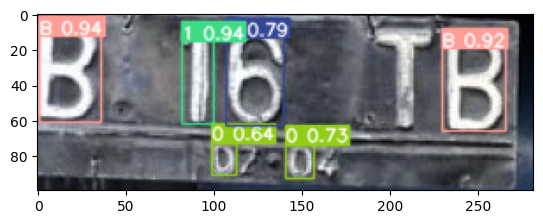

<ipython-input-45-98a28ee81623>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-45-98a28ee81623>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-45-98a28ee81623>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.065603,0.310,0.124113,0.60,0.003546,0.01,0.127659,0.61,B
1,27,0.322695,0.330,0.063830,0.58,0.290780,0.04,0.354610,0.62,1
2,32,0.437943,0.325,0.117021,0.61,0.379433,0.02,0.496454,0.63,6
3,1,0.879433,0.370,0.127660,0.58,0.815603,0.08,0.943263,0.66,B


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest3.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp20/DataTest3.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp20/labels/DataTest3.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest45.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest45.png: 128x320 1 B, 1 E, 2 Zs, 1 0, 1 2, 2 5s, 1 6, 53.0ms
Speed: 0.3ms pre-process, 53.0ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp21
1 labels sav

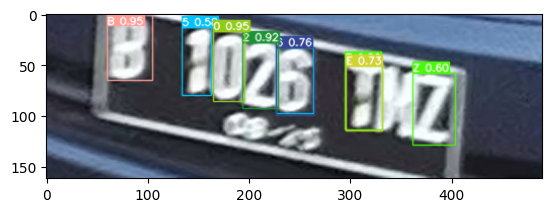

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.168367,0.200617,0.091837,0.401235,0.122449,-5.000000e-07,0.214285,0.401234,B
1,31,0.303061,0.287037,0.059184,0.413580,0.273469,8.024700e-02,0.332653,0.493827,5
2,26,0.368367,0.317901,0.063265,0.425926,0.336734,1.049380e-01,0.400000,0.530864,0
3,28,0.431633,0.373457,0.071429,0.401235,0.395919,1.728395e-01,0.467347,0.574075,2
4,31,0.501020,0.404321,0.075510,0.401235,0.463265,2.037035e-01,0.538775,0.604939,5
5,32,0.502041,0.410494,0.077551,0.413580,0.463265,2.037040e-01,0.540816,0.617284,6
6,25,0.639796,0.500000,0.075510,0.407407,0.602041,2.962965e-01,0.677551,0.703704,Z
7,4,0.640816,0.512346,0.073469,0.395062,0.604081,3.148150e-01,0.677551,0.709877,E
8,25,0.781633,0.577160,0.085714,0.438272,0.738776,3.580240e-01,0.824490,0.796296,Z


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest45.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp21/DataTest45.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp21/labels/DataTest45.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest51.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest51.png: 128x320 1 B, 1 T, 1 0, 2 1s, 2 6s, 1 7, 1 8, 1 9, 55.5ms
Speed: 0.3ms pre-process, 55.5ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp22
1 label

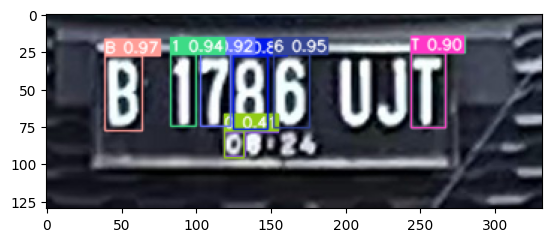

<ipython-input-45-98a28ee81623>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-45-98a28ee81623>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-45-98a28ee81623>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.155120,0.407692,0.075301,0.384615,0.117469,0.215385,0.192771,0.600000,B
1,27,0.275602,0.392308,0.051205,0.369231,0.250000,0.207693,0.301204,0.576923,1
2,33,0.340361,0.392308,0.060241,0.369231,0.310241,0.207693,0.370482,0.576923,7
3,32,0.409639,0.403846,0.072289,0.376923,0.373494,0.215384,0.445784,0.592307,6
4,34,0.411145,0.403846,0.069277,0.376923,0.376506,0.215384,0.445784,0.592307,8
5,32,0.493976,0.396154,0.072289,0.376923,0.457831,0.207693,0.530121,0.584615,6
6,27,0.769578,0.392308,0.069277,0.384615,0.734939,0.200000,0.804217,0.584615,1
7,19,0.769578,0.392308,0.069277,0.384615,0.734939,0.200000,0.804217,0.584615,T


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest51.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp22/DataTest51.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp22/labels/DataTest51.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest61.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest61.png: 160x320 1 A, 2 Bs, 2 1s, 2 2s, 1 5, 1 7, 72.1ms
Speed: 0.3ms pre-process, 72.1ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp23
1 labels saved t

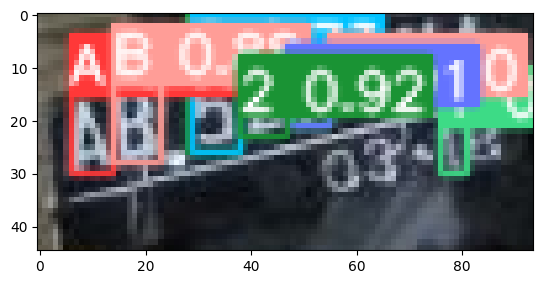

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.106383,0.500000,0.085106,0.333333,0.063830,0.333334,0.148936,0.666667,A
1,1,0.196809,0.455556,0.095745,0.333333,0.148937,0.288890,0.244681,0.622223,B
2,28,0.351064,0.411111,0.106383,0.333333,0.297872,0.244445,0.404255,0.577778,2
3,31,0.356383,0.411111,0.095745,0.333333,0.308511,0.244445,0.404255,0.577778,5
4,28,0.452128,0.344444,0.095745,0.333333,0.404256,0.177777,0.500000,0.511111,2
5,33,0.542553,0.300000,0.085106,0.333333,0.500000,0.133333,0.585106,0.466666,7
6,27,0.547872,0.300000,0.074468,0.333333,0.510638,0.133333,0.585106,0.466666,1
7,1,0.627660,0.244444,0.085106,0.311111,0.585107,0.088888,0.670213,0.400000,B
8,27,0.835106,0.566667,0.053192,0.200000,0.808510,0.466667,0.861702,0.666667,1


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest61.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp23/DataTest61.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp23/labels/DataTest61.txt')

detect: weights=['/content/best_bdc.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest76.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest76.png: 192x320 2 Vs, 2 5s, 1 9, 76.6ms
Speed: 0.4ms pre-process, 76.6ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp24
1 labels saved to yolov5/runs/de

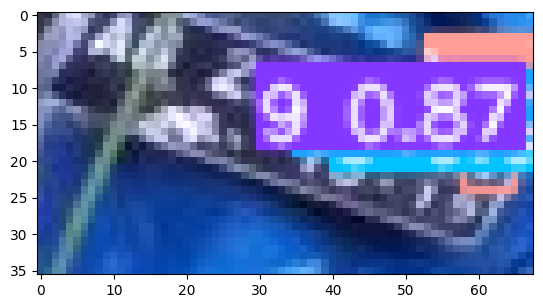

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,35,0.485294,0.291667,0.088235,0.194444,0.441176,0.194445,0.529412,0.388889,9
1,31,0.558824,0.333333,0.088235,0.222222,0.514706,0.222222,0.602942,0.444444,5
2,31,0.647059,0.388889,0.117647,0.222222,0.588236,0.277778,0.705883,0.500000,5
3,21,0.816176,0.486111,0.073529,0.194444,0.779411,0.388889,0.852941,0.583333,V
4,21,0.904412,0.555556,0.102941,0.222222,0.852942,0.444445,0.955882,0.666667,V


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest76.png --imgsz 300 --weights '/content/best_bdc.pt' --line-thickness 1 --save-txt
pred = '/content/yolov5/runs/detect/exp24/DataTest76.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp24/labels/DataTest76.txt')

# 500 epoch 600 images

In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest76.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt


detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest76.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest76.png: 192x320 1 A, 1 I, 1 U, 1 V, 1 2, 4 3s, 78.2ms
Speed: 0.3ms pre-process, 78.2ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp26
1 labels saved to yolo

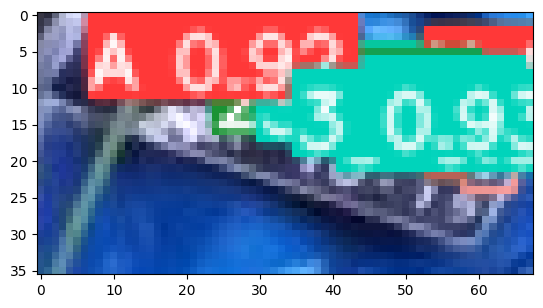

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.154412,0.111111,0.102941,0.222222,0.102941,0.000000,0.205882,0.222222,A
1,29,0.397059,0.236111,0.088235,0.250000,0.352941,0.111111,0.441177,0.361111,3
2,28,0.397059,0.236111,0.088235,0.194444,0.352941,0.138889,0.441177,0.333333,2
3,29,0.485294,0.277778,0.088235,0.222222,0.441176,0.166667,0.529412,0.388889,3
4,29,0.558824,0.333333,0.088235,0.222222,0.514706,0.222222,0.602942,0.444444,3
5,29,0.654412,0.388889,0.102941,0.222222,0.602942,0.277778,0.705882,0.500000,3
6,8,0.816176,0.486111,0.073529,0.250000,0.779411,0.361111,0.852941,0.611111,I
7,20,0.816176,0.486111,0.073529,0.250000,0.779411,0.361111,0.852941,0.611111,U
8,21,0.904412,0.541667,0.102941,0.250000,0.852942,0.416667,0.955882,0.666667,V


In [ ]:
pred = '/content/yolov5/runs/detect/exp26/DataTest76.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp26/labels/DataTest76.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest61.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest61.png: 160x320 2 As, 1 B, 1 X, 1 2, 1 5, 1 7, 1 8, 1 9, 68.5ms
Speed: 0.3ms pre-process, 68.5ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp27
1 labels sav

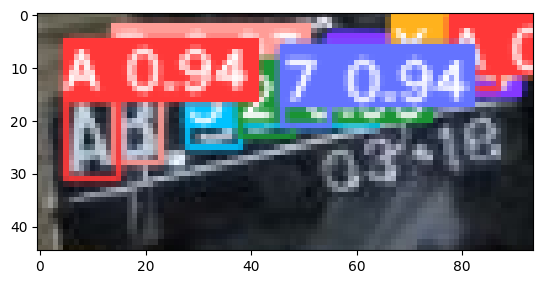

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.106383,0.522222,0.106383,0.333333,0.053192,3.555555e-01,0.159575,0.688889,A
1,1,0.196809,0.455556,0.095745,0.333333,0.148937,2.888895e-01,0.244681,0.622223,B
2,31,0.351064,0.388889,0.106383,0.333333,0.297872,2.222225e-01,0.404255,0.555555,5
3,28,0.457447,0.355556,0.106383,0.311111,0.404255,2.000005e-01,0.510638,0.511111,2
4,33,0.537234,0.300000,0.095745,0.333333,0.489362,1.333335e-01,0.585106,0.466666,7
5,34,0.632979,0.255556,0.095745,0.333333,0.585107,8.888950e-02,0.680851,0.422223,8
6,35,0.627660,0.255556,0.085106,0.333333,0.585107,8.888950e-02,0.670213,0.422223,9
7,23,0.771277,0.166667,0.117021,0.333333,0.712766,5.000000e-07,0.829788,0.333334,X
8,0,0.877660,0.155556,0.095745,0.311111,0.829788,5.000000e-07,0.925532,0.311111,A


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest61.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp27/DataTest61.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp27/labels/DataTest61.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest51.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest51.png: 128x320 1 B, 1 F, 1 J, 1 T, 1 U, 1 1, 1 6, 1 7, 1 8, 55.1ms
Speed: 0.3ms pre-process, 55.1ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp28
1 labels

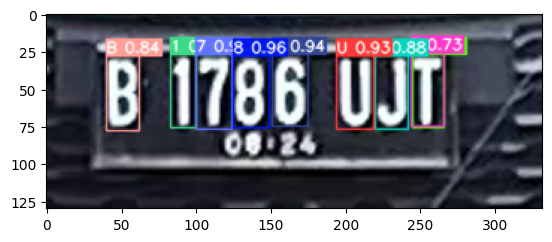

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.153614,0.407692,0.066265,0.384615,0.120481,0.215385,0.186747,0.600000,B
1,27,0.275602,0.396154,0.051205,0.376923,0.250000,0.207693,0.301204,0.584615,1
2,33,0.337349,0.400000,0.072289,0.384615,0.301204,0.207693,0.373494,0.592307,7
3,34,0.412651,0.400000,0.072289,0.369231,0.376506,0.215385,0.448796,0.584615,8
4,32,0.490964,0.392308,0.072289,0.369231,0.454819,0.207693,0.527109,0.576923,6
5,20,0.621988,0.403846,0.075301,0.376923,0.584337,0.215384,0.659639,0.592307,U
6,9,0.695783,0.403846,0.066265,0.376923,0.662650,0.215384,0.728916,0.592307,J
7,19,0.768072,0.388462,0.066265,0.376923,0.734939,0.200000,0.801205,0.576923,T
8,5,0.769578,0.396154,0.063253,0.376923,0.737951,0.207693,0.801204,0.584615,F


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest51.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp28/DataTest51.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp28/labels/DataTest51.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest45.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest45.png: 128x320 1 B, 1 F, 1 M, 1 Z, 1 5, 87.3ms
Speed: 0.4ms pre-process, 87.3ms inference, 1.6ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp29
1 labels saved to yolov5/run

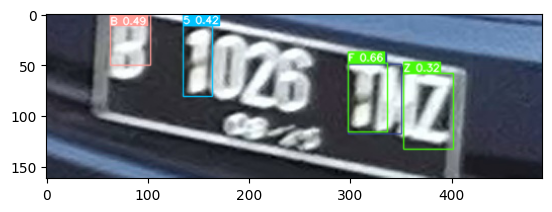

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.169388,0.154321,0.081633,0.308642,0.128572,0.000000,0.210204,0.308642,B
1,31,0.305102,0.283951,0.059184,0.432099,0.275510,0.067902,0.334694,0.500001,5
2,5,0.647959,0.506173,0.079592,0.419753,0.608163,0.296296,0.687755,0.716050,F
3,12,0.662245,0.515432,0.108163,0.425926,0.608163,0.302469,0.716326,0.728395,M
4,25,0.770408,0.589506,0.100000,0.462963,0.720408,0.358024,0.820408,0.820987,Z


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest45.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp29/DataTest45.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp29/labels/DataTest45.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest3.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest3.png: 128x320 2 Bs, 1 T, 1 1, 1 6, 54.4ms
Speed: 0.3ms pre-process, 54.4ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp30
1 labels saved to yolov5/runs/dete

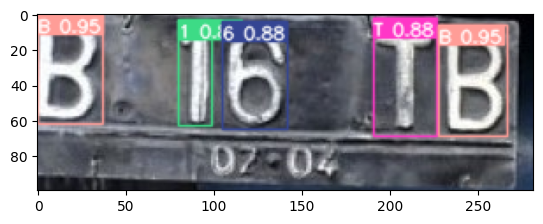

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.065603,0.310,0.131206,0.62,-2.000000e-07,0.00,0.131206,0.62,B
1,27,0.317376,0.330,0.067376,0.60,2.836880e-01,0.03,0.351064,0.63,1
2,32,0.437943,0.345,0.131206,0.61,3.723400e-01,0.04,0.503546,0.65,6
3,19,0.741135,0.355,0.127660,0.67,6.773050e-01,0.02,0.804965,0.69,T
4,1,0.877660,0.375,0.138298,0.63,8.085110e-01,0.06,0.946809,0.69,B


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest3.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp30/DataTest3.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp30/labels/DataTest3.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest23.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest23.png: 96x320 1 A, 1 B, 1 E, 2 4s, 2 6s, 1 8, 2 9s, 44.8ms
Speed: 0.3ms pre-process, 44.8ms inference, 1.5ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp31
1 labels saved t

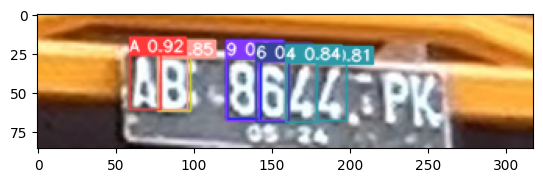

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.216981,0.505814,0.062893,0.406977,0.185534,0.302326,0.248428,0.709302,A
1,4,0.275157,0.523256,0.066038,0.395349,0.242138,0.325582,0.308176,0.720931,E
2,1,0.272013,0.517442,0.059748,0.383721,0.242139,0.325581,0.301887,0.709302,B
3,34,0.415094,0.552326,0.069182,0.453488,0.380503,0.325582,0.449685,0.779070,8
4,35,0.413522,0.558140,0.066038,0.465116,0.380503,0.325582,0.446541,0.790698,9
5,32,0.416667,0.552326,0.066038,0.453488,0.383648,0.325582,0.449686,0.779070,6
6,35,0.473270,0.569767,0.066038,0.441860,0.440251,0.348837,0.506289,0.790697,9
7,32,0.473270,0.575581,0.066038,0.453488,0.440251,0.348837,0.506289,0.802325,6
8,30,0.531447,0.581395,0.062893,0.441860,0.500000,0.360465,0.562894,0.802325,4
9,30,0.592767,0.581395,0.059748,0.418605,0.562893,0.372092,0.622641,0.790698,4


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest23.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp31/DataTest23.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp31/labels/DataTest23.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest15.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest15.png: 192x320 1 B, 1 S, 1 T, 1 Z, 1 0, 2 1s, 1 2, 1 8, 76.8ms
Speed: 0.4ms pre-process, 76.8ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp32
1 labels sav

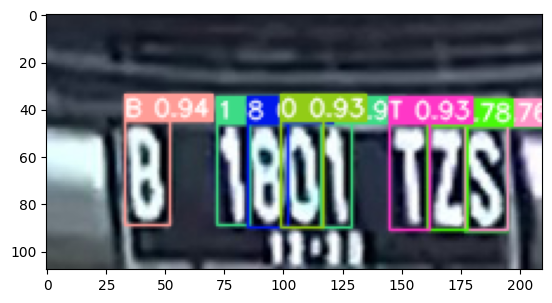

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.202381,0.620370,0.090476,0.407407,0.157143,0.416666,0.247619,0.824074,B
1,27,0.376190,0.625000,0.066667,0.398148,0.342857,0.425926,0.409523,0.824074,1
2,34,0.445238,0.629630,0.080952,0.407407,0.404762,0.425926,0.485714,0.833334,8
3,26,0.514286,0.625000,0.085714,0.416667,0.471429,0.416666,0.557143,0.833333,0
4,27,0.583333,0.629630,0.061905,0.407407,0.552381,0.425926,0.614285,0.833334,1
5,19,0.730952,0.634259,0.080952,0.416667,0.690476,0.425926,0.771428,0.842593,T
6,25,0.807143,0.638889,0.080952,0.407407,0.766667,0.435186,0.847619,0.842593,Z
7,28,0.885714,0.648148,0.085714,0.407407,0.842857,0.444444,0.928571,0.851851,2
8,18,0.885714,0.638889,0.085714,0.407407,0.842857,0.435186,0.928571,0.842593,S


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest15.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp32/DataTest15.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp32/labels/DataTest15.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest87.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest87.png: 96x320 2 Bs, 1 F, 1 R, 1 0, 1 1, 1 3, 1 9, 44.8ms
Speed: 0.2ms pre-process, 44.8ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp33
1 labels saved to 

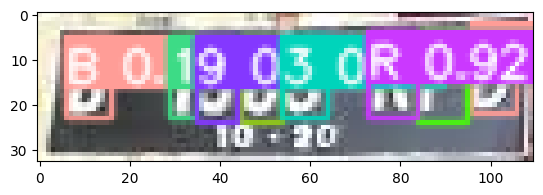

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.100000,0.424242,0.090909,0.545455,0.054545,0.151514,0.145455,0.696970,B
1,27,0.290909,0.424242,0.054545,0.545455,0.263636,0.151514,0.318182,0.696970,1
2,35,0.359091,0.439394,0.081818,0.575758,0.318182,0.151515,0.400000,0.727273,9
3,26,0.450000,0.439394,0.081818,0.575758,0.409091,0.151515,0.490909,0.727273,0
4,29,0.536364,0.424242,0.090909,0.545455,0.490909,0.151514,0.581819,0.696970,3
5,17,0.713636,0.409091,0.100000,0.575758,0.663636,0.121212,0.763636,0.696970,R
6,5,0.813636,0.424242,0.100000,0.606061,0.763636,0.121212,0.863636,0.727272,F
7,1,0.918182,0.363636,0.090909,0.606061,0.872727,0.060606,0.963637,0.666667,B


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest87.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp33/DataTest87.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp33/labels/DataTest87.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest17.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest17.png: 128x320 1 B, 1 K, 1 Q, 1 1, 1 3, 1 6, 3 9s, 93.0ms
Speed: 0.4ms pre-process, 93.0ms inference, 1.9ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp36
1 labels saved to

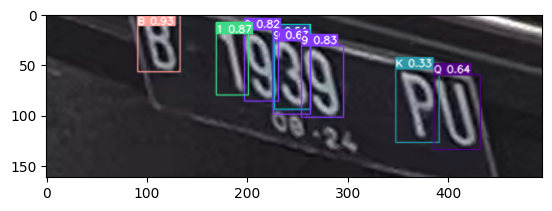

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.226721,0.175926,0.085020,0.351852,0.184211,0.000000,0.269231,0.351852,B
1,27,0.374494,0.271605,0.064777,0.444444,0.342105,0.049383,0.406883,0.493827,1
2,35,0.433198,0.311728,0.068826,0.438272,0.398785,0.092592,0.467611,0.530864,9
3,32,0.493927,0.361111,0.076923,0.450617,0.455465,0.135803,0.532389,0.586419,6
4,35,0.494939,0.385802,0.074899,0.450617,0.457490,0.160493,0.532388,0.611111,9
5,29,0.495951,0.354938,0.072874,0.450617,0.459514,0.129629,0.532388,0.580246,3
6,35,0.556680,0.410494,0.085020,0.438272,0.514170,0.191358,0.599190,0.629630,9
7,10,0.747976,0.558642,0.087044,0.450617,0.704454,0.333333,0.791498,0.783950,K
8,16,0.827935,0.598765,0.093117,0.456790,0.781376,0.370370,0.874494,0.827160,Q


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest17.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp36/DataTest17.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp36/labels/DataTest17.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest24.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest24.png: 128x320 1 B, 1 C, 1 K, 1 T, 2 0s, 2 1s, 1 6, 1 7, 59.6ms
Speed: 0.4ms pre-process, 59.6ms inference, 1.4ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp37
1 labels sa

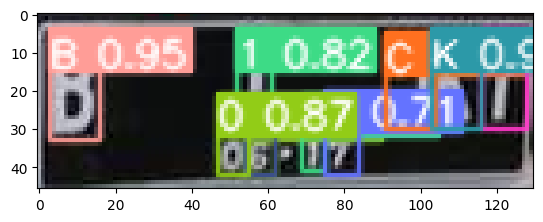

<ipython-input-45-98a28ee81623>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['x'] = (ambil['center_x']-(ambil['width']/2))
<ipython-input-45-98a28ee81623>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ambil['y'] = (ambil['center_y']-(ambil['height']/2))
<ipython-input-45-98a28ee81623>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.073077,0.402174,0.100000,0.630435,0.023077,0.086956,0.123077,0.717391,B
1,26,0.392308,0.804348,0.061539,0.217391,0.361539,0.695653,0.423077,0.913043,0
2,27,0.434615,0.380435,0.069231,0.586957,0.400000,0.086957,0.469230,0.673914,1
3,32,0.446154,0.804348,0.061539,0.217391,0.415385,0.695653,0.476923,0.913043,6
4,33,0.611538,0.793478,0.069231,0.239130,0.576923,0.673913,0.646153,0.913043,7
5,2,0.750000,0.380435,0.100000,0.543478,0.700000,0.108696,0.800000,0.652174,C
6,10,0.842308,0.369565,0.100000,0.565217,0.792308,0.086956,0.892308,0.652173,K
7,19,0.938462,0.369565,0.092308,0.565217,0.892308,0.086956,0.984616,0.652173,T


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest24.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp37/DataTest24.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp37/labels/DataTest24.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest25.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest25.png: 96x320 2 As, 2 Bs, 1 7, 67.5ms
Speed: 0.3ms pre-process, 67.5ms inference, 1.5ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp38
1 labels saved to yolov5/runs/detect/

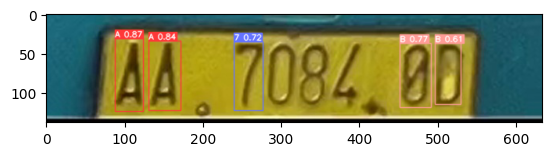

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.167192,0.561594,0.056782,0.673913,0.138801,0.224638,0.195583,0.898551,A
1,0,0.238959,0.568841,0.064669,0.644928,0.206625,0.246377,0.271293,0.891305,A
2,33,0.407729,0.572464,0.058360,0.637681,0.378549,0.253623,0.436909,0.891304,7
3,1,0.744479,0.565217,0.063091,0.594203,0.712933,0.268115,0.776025,0.862318,B
4,1,0.809937,0.550725,0.052050,0.565217,0.783912,0.268117,0.835962,0.833333,B


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest25.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp38/DataTest25.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp38/labels/DataTest25.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest26.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest26.png: 192x320 1 B, 1 E, 1 G, 1 K, 3 1s, 1 3, 100.1ms
Speed: 0.5ms pre-process, 100.1ms inference, 1.5ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp39
1 labels saved to yo

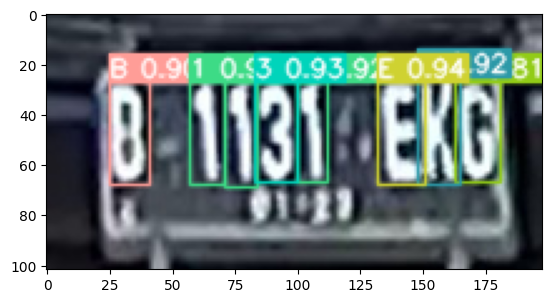

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.166667,0.465686,0.080808,0.401961,0.126263,0.264705,0.207071,0.666667,B
1,27,0.323232,0.465686,0.070707,0.401961,0.287878,0.264705,0.358586,0.666667,1
2,27,0.391414,0.470588,0.065657,0.411765,0.358586,0.264706,0.424242,0.676470,1
3,29,0.462121,0.460784,0.085859,0.392157,0.419192,0.264706,0.505050,0.656863,3
4,27,0.535354,0.460784,0.060606,0.392157,0.505051,0.264706,0.565657,0.656863,1
5,4,0.714646,0.465686,0.095960,0.401961,0.666666,0.264705,0.762626,0.666667,E
6,10,0.790404,0.455882,0.085859,0.421569,0.747475,0.245097,0.833333,0.666667,K
7,6,0.868687,0.460784,0.090909,0.392157,0.823232,0.264706,0.914142,0.656863,G


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest26.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp39/DataTest26.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp39/labels/DataTest26.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest29.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest29.png: 96x320 1 A, 2 Bs, 1 E, 1 3, 2 4s, 1 8, 44.3ms
Speed: 0.3ms pre-process, 44.3ms inference, 1.3ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp40
1 labels saved to yolo

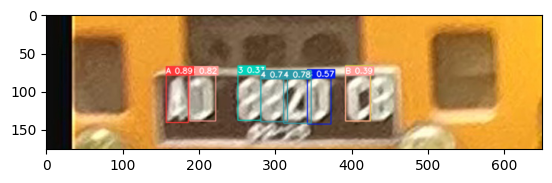

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.263846,0.625000,0.044615,0.352273,0.241538,0.448863,0.286154,0.801137,A
1,1,0.315385,0.619318,0.052308,0.340909,0.289231,0.448864,0.341539,0.789772,B
2,29,0.409231,0.613636,0.046154,0.340909,0.386154,0.443181,0.432308,0.784091,3
3,30,0.459231,0.636364,0.053846,0.318182,0.432308,0.477273,0.486154,0.795455,4
4,30,0.506154,0.642045,0.055385,0.329545,0.478462,0.477272,0.533846,0.806817,4
5,34,0.550000,0.642045,0.047692,0.340909,0.526154,0.471590,0.573846,0.812499,8
6,1,0.627692,0.619318,0.049231,0.340909,0.603077,0.448864,0.652307,0.789772,B
7,4,0.628462,0.616477,0.050769,0.346591,0.603077,0.443182,0.653847,0.789772,E


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest29.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp40/DataTest29.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp40/labels/DataTest29.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest30.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest30.png: 160x320 1 A, 1 M, 66.5ms
Speed: 0.4ms pre-process, 66.5ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp41
1 labels saved to yolov5/runs/detect/exp41/

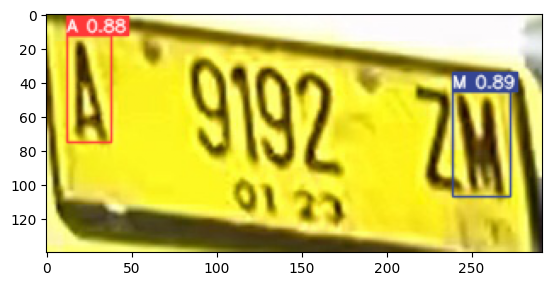

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.085616,0.310714,0.089041,0.450000,0.041096,0.085714,0.130137,0.535714,A
1,12,0.876712,0.542857,0.116438,0.442857,0.818493,0.321429,0.934931,0.764286,M


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest30.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp41/DataTest30.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp41/labels/DataTest30.txt')

In [ ]:
import cv2

def convert_to_grayscale_and_blur(image_path, output_path):
    image = cv2.imread(image_path)
    grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred_image = cv2.medianBlur(grayscale_image, 5)
    cv2.imwrite(output_path, blurred_image)

In [ ]:
convert_to_grayscale_and_blur('/content/datatest_bdc/datatest_bdc/DataTest30.png', '/content/datatest_bdc/datatest_bdc/DataTest30.png')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest30.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest30.png: 160x320 1 A, 1 M, 1 Z, 2 1s, 1 2, 2 9s, 96.0ms
Speed: 0.4ms pre-process, 96.0ms inference, 1.4ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp42
1 labels saved to yol

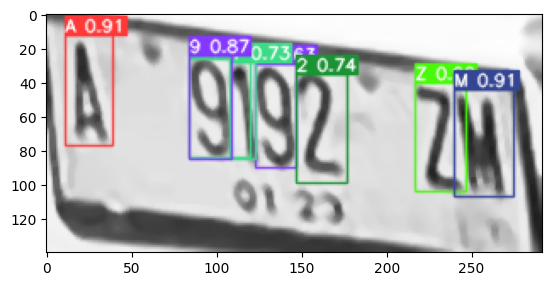

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.085616,0.317857,0.095890,0.464286,0.037671,0.085714,0.133562,0.550000,A
1,35,0.330479,0.389286,0.085616,0.435714,0.287671,0.171429,0.373287,0.607143,9
2,27,0.349315,0.392857,0.123288,0.414286,0.287671,0.185714,0.410959,0.600000,1
3,27,0.395548,0.403571,0.051370,0.407143,0.369863,0.200000,0.421233,0.607143,1
4,35,0.462329,0.425000,0.082192,0.435714,0.421233,0.207143,0.503425,0.642857,9
5,28,0.554795,0.478571,0.102740,0.457143,0.503425,0.250000,0.606165,0.707143,2
6,25,0.794521,0.514286,0.102740,0.457143,0.743151,0.285714,0.845891,0.742858,Z
7,12,0.881849,0.539286,0.119863,0.450000,0.821917,0.314286,0.941781,0.764286,M


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest30.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp42/DataTest30.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp42/labels/DataTest30.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest31.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest31.png: 128x320 1 0, 1 2, 54.6ms
Speed: 0.3ms pre-process, 54.6ms inference, 1.0ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp43
1 labels saved to yolov5/runs/detect/exp43/

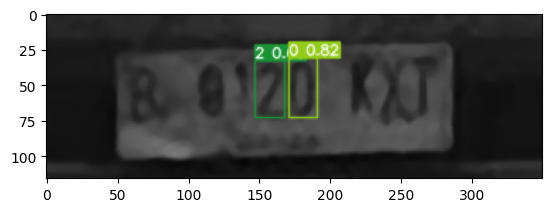

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,28,0.450000,0.456897,0.060000,0.344828,0.420000,0.284483,0.480000,0.629311,2
1,26,0.517143,0.448276,0.057143,0.362069,0.488572,0.267242,0.545714,0.629310,0


In [ ]:
convert_to_grayscale_and_blur('/content/datatest_bdc/datatest_bdc/DataTest31.png', '/content/datatest_bdc/datatest_bdc/DataTest31.png')
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest31.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp43/DataTest31.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp43/labels/DataTest31.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest32.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest32.png: 128x320 1 B, 1 F, 1 T, 1 1, 1 3, 1 4, 2 6s, 57.7ms
Speed: 0.3ms pre-process, 57.7ms inference, 2.7ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp44
1 labels saved to

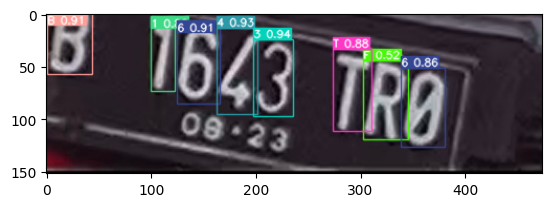

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.047468,0.190789,0.090717,0.381579,0.002110,-5.000000e-07,0.092827,0.381578,B
1,27,0.235232,0.253289,0.048523,0.467105,0.210970,1.973650e-02,0.259494,0.486841,1
2,32,0.306962,0.305921,0.086498,0.519737,0.263713,4.605250e-02,0.350211,0.565789,6
3,30,0.385021,0.361842,0.082279,0.539474,0.343882,9.210500e-02,0.426160,0.631579,4
4,29,0.457806,0.404605,0.080169,0.480263,0.417722,1.644735e-01,0.497890,0.644737,3
5,19,0.617089,0.480263,0.078059,0.513158,0.578059,2.236840e-01,0.656119,0.736842,T
6,5,0.684599,0.542763,0.090717,0.493421,0.639240,2.960525e-01,0.729958,0.789473,F
7,32,0.759494,0.588816,0.088608,0.493421,0.715190,3.421055e-01,0.803798,0.835527,6


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest32.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp44/DataTest32.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp44/labels/DataTest32.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest33.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest33.png: 96x320 1 T, 48.3ms
Speed: 0.2ms pre-process, 48.3ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp45
1 labels saved to yolov5/runs/detect/exp45/labels

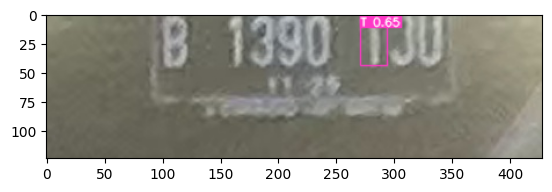

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,19,0.660047,0.177419,0.053738,0.354839,0.633178,-5.000000e-07,0.686916,0.354839,T


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest33.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp45/DataTest33.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp45/labels/DataTest33.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest34.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest34.png: 192x320 1 A, 1 B, 1 Q, 1 V, 1 0, 1 1, 1 2, 1 5, 1 9, 83.7ms
Speed: 0.3ms pre-process, 83.7ms inference, 2.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp46
1 labels

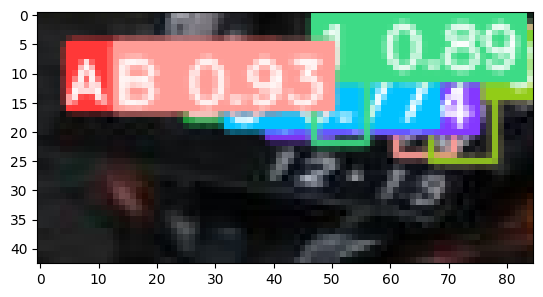

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.111765,0.232558,0.105882,0.232558,0.058824,0.116279,0.164706,0.348837,A
1,1,0.211765,0.244186,0.117647,0.255814,0.152942,0.116279,0.270589,0.372093,B
2,28,0.358824,0.290698,0.129412,0.255814,0.294118,0.162791,0.423530,0.418605,2
3,31,0.441176,0.313953,0.129412,0.255814,0.376470,0.186046,0.505882,0.441860,5
4,35,0.523529,0.348837,0.129412,0.279070,0.458823,0.209302,0.588235,0.488372,9
5,27,0.605882,0.383721,0.105882,0.255814,0.552941,0.255814,0.658823,0.511628,1
6,21,0.776471,0.430233,0.117647,0.255814,0.717647,0.302326,0.835295,0.558140,V
7,16,0.852941,0.453488,0.129412,0.255814,0.788235,0.325581,0.917647,0.581395,Q
8,26,0.852941,0.453488,0.129412,0.255814,0.788235,0.325581,0.917647,0.581395,0


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest34.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp46/DataTest34.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp46/labels/DataTest34.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest35.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest35.png: 128x320 2 Bs, 1 E, 1 F, 1 R, 1 T, 1 0, 1 1, 1 6, 1 8, 52.6ms
Speed: 0.3ms pre-process, 52.6ms inference, 1.3ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp47
1 label

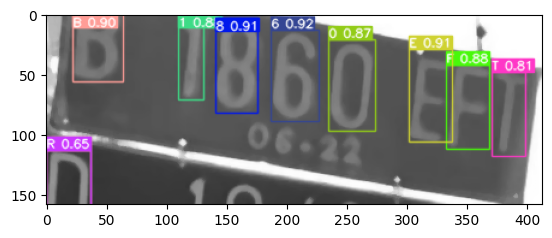

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.044794,0.857595,0.089588,0.284810,0.000000,7.151900e-01,0.089588,1.000000,B
1,17,0.044794,0.857595,0.089588,0.284810,0.000000,7.151900e-01,0.089588,1.000000,R
2,1,0.104116,0.177215,0.101695,0.354430,0.053269,0.000000e+00,0.154964,0.354430,B
3,27,0.291768,0.224684,0.050847,0.449367,0.266344,5.000000e-07,0.317192,0.449368,1
4,34,0.383777,0.268987,0.084746,0.500000,0.341404,1.898700e-02,0.426150,0.518987,8
5,32,0.501211,0.322785,0.096852,0.481013,0.452785,8.227850e-02,0.549637,0.563292,6
6,26,0.616223,0.373418,0.094431,0.481013,0.569007,1.329115e-01,0.663438,0.613924,0
7,4,0.774818,0.427215,0.087167,0.487342,0.731234,1.835440e-01,0.818402,0.670886,E
8,5,0.849879,0.487342,0.087167,0.443038,0.806295,2.658230e-01,0.893463,0.708861,F
9,19,0.932203,0.525316,0.067797,0.443038,0.898305,3.037970e-01,0.966101,0.746835,T


In [ ]:
convert_to_grayscale_and_blur('/content/datatest_bdc/datatest_bdc/DataTest35.png', '/content/datatest_bdc/datatest_bdc/DataTest35.png')
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest35.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp47/DataTest35.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp47/labels/DataTest35.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest36.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest36.png: 224x320 (no detections), 89.5ms
Speed: 0.5ms pre-process, 89.5ms inference, 0.3ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp49
0 labels saved to yolov5/runs/detect

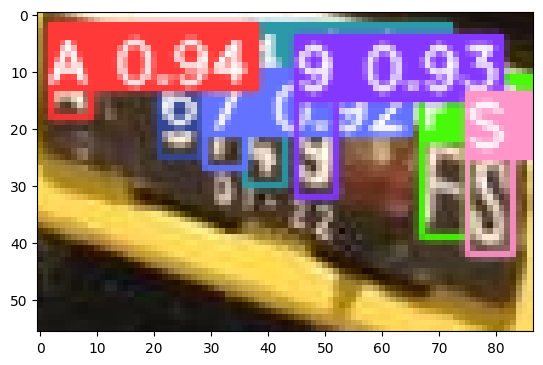

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.063218,0.178571,0.080460,0.285714,0.022988,0.035714,0.103448,0.321428,A
1,32,0.281609,0.303571,0.080460,0.285714,0.241379,0.160714,0.321839,0.446428,6
2,33,0.373563,0.330357,0.080460,0.303571,0.333333,0.178572,0.413793,0.482143,7
3,30,0.454023,0.383929,0.080460,0.303571,0.413793,0.232144,0.494253,0.535714,4
4,35,0.557471,0.419643,0.080460,0.303571,0.517241,0.267857,0.597701,0.571429,9
5,5,0.816092,0.544643,0.091954,0.303571,0.770115,0.392857,0.862069,0.696429,F
6,18,0.908046,0.598214,0.091954,0.303571,0.862069,0.446429,0.954023,0.750000,S


In [ ]:
convert_to_grayscale_and_blur('/content/datatest_bdc/datatest_bdc/DataTest36.png', '/content/datatest_bdc/datatest_bdc/DataTest36.png')

!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest36.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp48/DataTest36.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp48/labels/DataTest36.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest37.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest37.png: 128x320 1 B, 1 F, 1 M, 1 O, 2 Rs, 1 1, 2 5s, 2 6s, 59.1ms
Speed: 0.3ms pre-process, 59.1ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp50
1 labels s

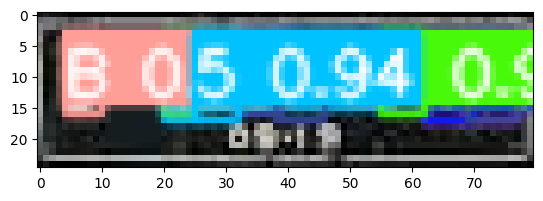

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.08750,0.38,0.0750,0.52,0.0500,0.12,0.1250,0.64,B
1,31,0.28125,0.42,0.0625,0.52,0.2500,0.16,0.3125,0.68,5
2,27,0.28125,0.38,0.0625,0.52,0.2500,0.12,0.3125,0.64,1
3,31,0.35625,0.40,0.0875,0.56,0.3125,0.12,0.4000,0.68,5
4,32,0.44375,0.38,0.0875,0.52,0.4000,0.12,0.4875,0.64,6
5,32,0.52500,0.40,0.1000,0.56,0.4750,0.12,0.5750,0.68,6
6,5,0.73125,0.38,0.0875,0.52,0.6875,0.12,0.7750,0.64,F
7,14,0.82500,0.42,0.1000,0.52,0.7750,0.16,0.8750,0.68,O
8,17,0.81875,0.40,0.0875,0.56,0.7750,0.12,0.8625,0.68,R
9,17,0.91250,0.40,0.1000,0.56,0.8625,0.12,0.9625,0.68,R


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest37.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp50/DataTest37.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp50/labels/DataTest37.txt')

In [ ]:
def convert_to_grayscale_and_blur2(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (300, 300))
    grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred_image = cv2.medianBlur(grayscale_image, 5)
    cv2.imwrite(image_path, blurred_image)

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest37.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest37.png: 128x320 1 B, 1 F, 1 M, 1 O, 2 Rs, 1 1, 2 5s, 2 6s, 86.0ms
Speed: 0.4ms pre-process, 86.0ms inference, 1.5ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp51
1 labels s

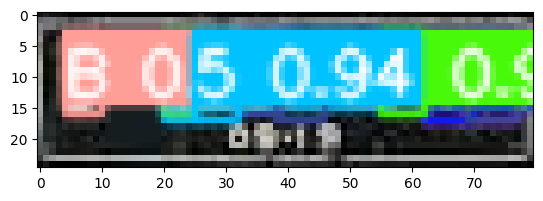

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.08750,0.38,0.0750,0.52,0.0500,0.12,0.1250,0.64,B
1,31,0.28125,0.42,0.0625,0.52,0.2500,0.16,0.3125,0.68,5
2,27,0.28125,0.38,0.0625,0.52,0.2500,0.12,0.3125,0.64,1
3,31,0.35625,0.40,0.0875,0.56,0.3125,0.12,0.4000,0.68,5
4,32,0.44375,0.38,0.0875,0.52,0.4000,0.12,0.4875,0.64,6
5,32,0.52500,0.40,0.1000,0.56,0.4750,0.12,0.5750,0.68,6
6,5,0.73125,0.38,0.0875,0.52,0.6875,0.12,0.7750,0.64,F
7,14,0.82500,0.42,0.1000,0.52,0.7750,0.16,0.8750,0.68,O
8,17,0.81875,0.40,0.0875,0.56,0.7750,0.12,0.8625,0.68,R
9,17,0.91250,0.40,0.1000,0.56,0.8625,0.12,0.9625,0.68,R


In [ ]:
convert_to_grayscale_and_blur2('/content/yolov5/runs/detect/exp50/DataTest37.png')
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest37.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp51/DataTest37.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp51/labels/DataTest37.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest40.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest40.png: 128x320 1 B, 1 J, 2 5s, 2 9s, 53.5ms
Speed: 0.3ms pre-process, 53.5ms inference, 1.1ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp52
1 labels saved to yolov5/runs/d

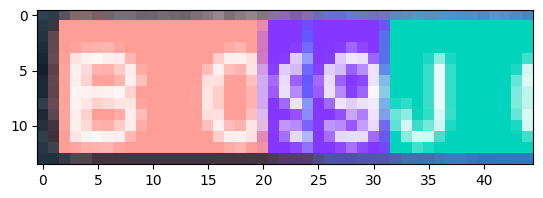

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.088889,0.357143,0.088889,0.571429,0.044444,0.071429,0.133333,0.642857,B
1,35,0.500000,0.357143,0.066667,0.571429,0.466667,0.071429,0.533333,0.642857,9
2,31,0.600000,0.357143,0.088889,0.571429,0.555556,0.071429,0.644444,0.642857,5
3,35,0.588889,0.357143,0.066667,0.571429,0.555556,0.071429,0.622222,0.642857,9
4,9,0.744444,0.357143,0.066667,0.571429,0.711111,0.071429,0.777777,0.642857,J
5,31,0.833333,0.357143,0.066667,0.571429,0.800000,0.071429,0.866666,0.642857,5


In [ ]:
!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest40.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp52/DataTest40.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp52/labels/DataTest40.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest49.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest49.png: 192x320 1 A, 1 B, 1 C, 1 G, 1 K, 1 S, 1 X, 1 2, 1 3, 1 4, 2 5s, 124.1ms
Speed: 0.4ms pre-process, 124.1ms inference, 2.0ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/e

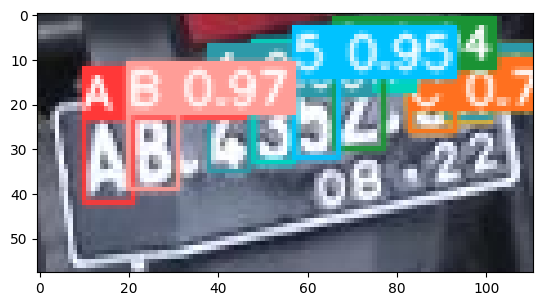

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,0,0.139640,0.560345,0.099099,0.327586,0.090090,0.396552,0.189190,0.724138,A
1,1,0.229730,0.525862,0.099099,0.293103,0.180180,0.379311,0.279280,0.672413,B
2,30,0.382883,0.456897,0.081081,0.293103,0.342342,0.310345,0.423424,0.603449,4
3,31,0.472973,0.431034,0.081081,0.275862,0.432432,0.293103,0.513514,0.568965,5
4,29,0.472973,0.431034,0.081081,0.275862,0.432432,0.293103,0.513514,0.568965,3
5,31,0.558559,0.396552,0.090090,0.310345,0.513514,0.241380,0.603604,0.551724,5
6,28,0.644144,0.362069,0.099099,0.310345,0.594594,0.206896,0.693694,0.517241,2
7,18,0.792793,0.301724,0.090090,0.293103,0.747748,0.155172,0.837838,0.448275,S
8,6,0.792793,0.310345,0.090090,0.275862,0.747748,0.172414,0.837838,0.448276,G
9,2,0.792793,0.310345,0.090090,0.275862,0.747748,0.172414,0.837838,0.448276,C


In [ ]:

!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest49.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp54/DataTest49.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp54/labels/DataTest49.txt')

detect: weights=['/content/best.pt'], source=/content/datatest_bdc/datatest_bdc/DataTest50.png, data=yolov5/data/coco128.yaml, imgsz=[300, 300], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7107217 parameters, 0 gradients
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/1 /content/datatest_bdc/datatest_bdc/DataTest50.png: 128x320 2 Bs, 1 E, 1 1, 1 5, 1 8, 1 9, 59.6ms
Speed: 0.4ms pre-process, 59.6ms inference, 1.2ms NMS per image at shape (1, 3, 320, 320)
Results saved to yolov5/runs/detect/exp55
1 labels saved to yolo

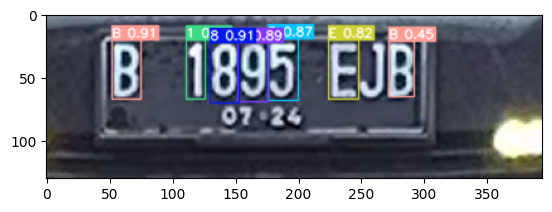

,label,center_x,center_y,width,height,x,y,x2,y2,labelasli
0,1,0.161168,0.334615,0.058376,0.361538,0.131980,0.153846,0.190356,0.515384,B
1,27,0.300761,0.334615,0.038071,0.361538,0.281725,0.153846,0.319797,0.515384,1
2,34,0.359137,0.353846,0.058376,0.369231,0.329949,0.169231,0.388325,0.538461,8
3,35,0.416244,0.350000,0.060914,0.361538,0.385787,0.169231,0.446701,0.530769,9
4,31,0.477157,0.334615,0.060914,0.376923,0.446700,0.146153,0.507614,0.523076,5
5,4,0.598985,0.334615,0.060914,0.361538,0.568528,0.153846,0.629442,0.515384,E
6,1,0.715736,0.330769,0.050761,0.338462,0.690355,0.161538,0.741117,0.500000,B


In [ ]:

!python yolov5/detect.py --source /content/datatest_bdc/datatest_bdc/DataTest50.png --imgsz 300 --weights '/content/best.pt' --line-thickness 1 --save-txt

pred = '/content/yolov5/runs/detect/exp55/DataTest50.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()
med('/content/yolov5/runs/detect/exp55/labels/DataTest50.txt')

# SELESAI

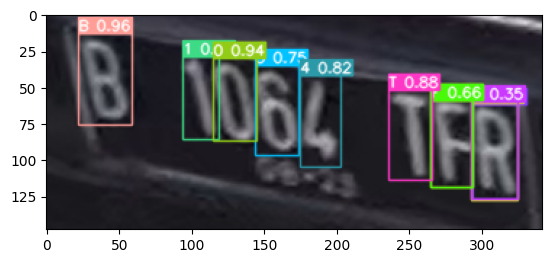

In [ ]:
pred = '/content/yolov5/runs/detect/exp18/DataTest7.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

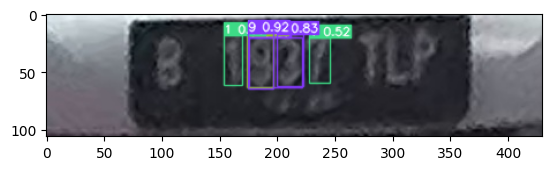

In [ ]:
pred = '/content/yolov5/runs/detect/exp16/DataTest43.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

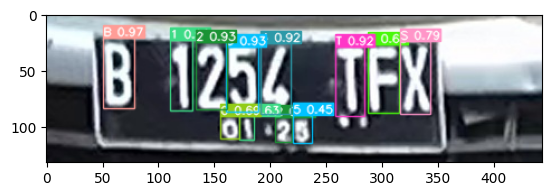

In [ ]:
pred = '/content/yolov5/runs/detect/exp16/DataTest39.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

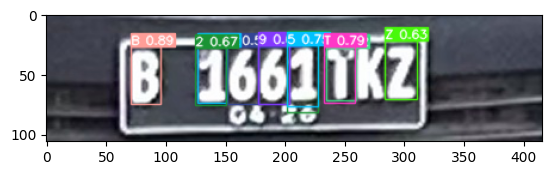

In [ ]:
pred = '/content/yolov5/runs/detect/exp15/DataTest4.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

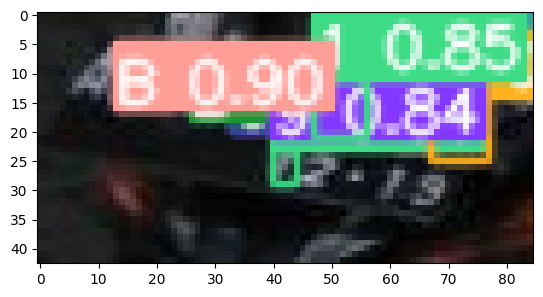

In [ ]:
pred = '/content/yolov5/runs/detect/exp14/DataTest34.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

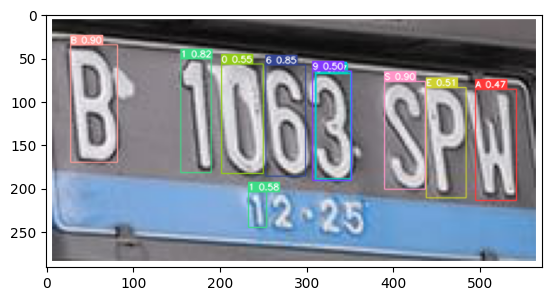

In [ ]:
pred = '/content/yolov5/runs/detect/exp13/DataTest55.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

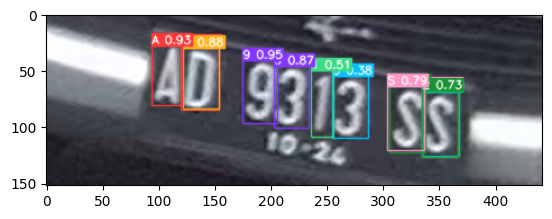

In [ ]:
pred = '/content/yolov5/runs/detect/exp12/DataTest13.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

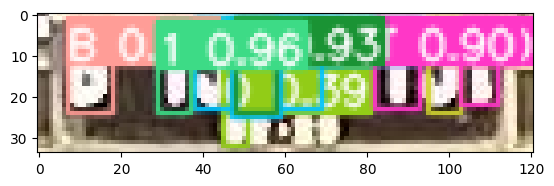

In [ ]:
pred = '/content/yolov5/runs/detect/exp10/DataTest77.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

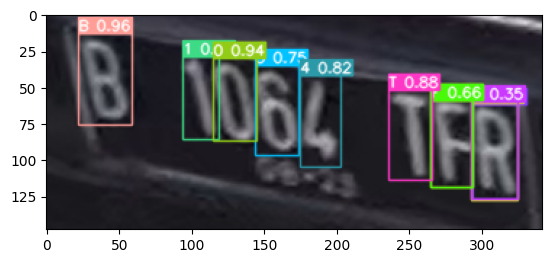

In [ ]:
pred = '/content/yolov5/runs/detect/exp9/DataTest7.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

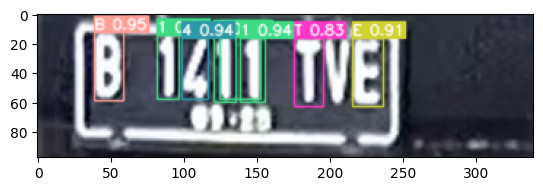

In [ ]:
pred = '/content/yolov5/runs/detect/exp8/DataTest84.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

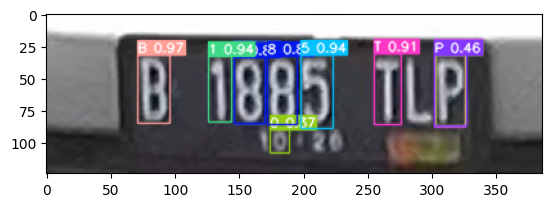

In [ ]:
pred = '/content/yolov5/runs/detect/exp7/DataTest90.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

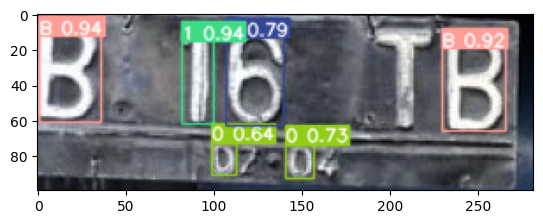

In [ ]:
pred = '/content/yolov5/runs/detect/exp6/DataTest3.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

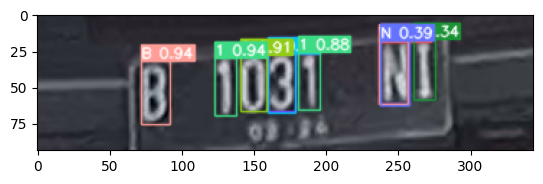

In [ ]:
pred = '/content/yolov5/runs/detect/exp5/DataTest65.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

In [ ]:
pred = '/content/yolov5/runs/detect/exp4/DataTest45.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

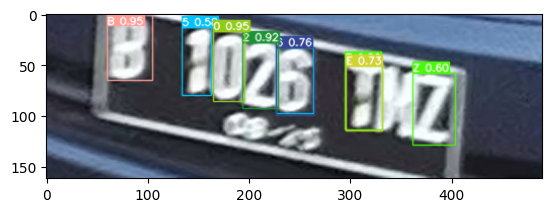

In [ ]:
pred = '/content/yolov5/runs/detect/exp4/DataTest45.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

In [ ]:
# model 200 epochs

# model 200 epochs

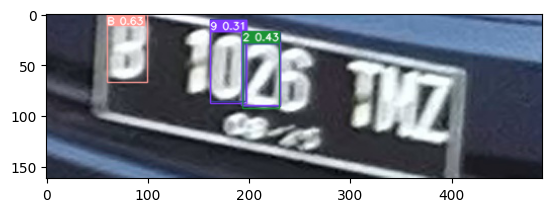

In [ ]:
pred = '/content/yolov5/runs/detect/exp3/DataTest45.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

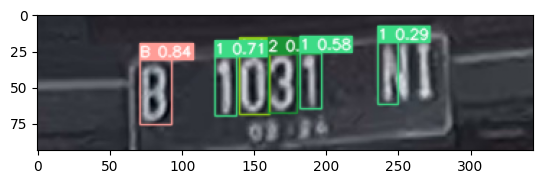

In [ ]:
pred = '/content/yolov5/runs/detect/exp2/DataTest65.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

# model lama

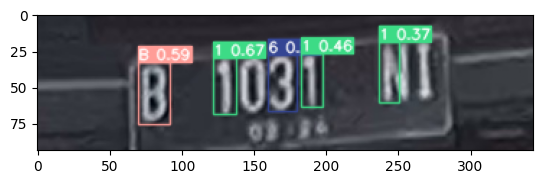

In [ ]:
pred = '/content/yolov5/runs/detect/exp31/DataTest65.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

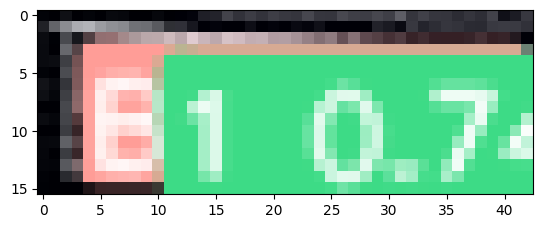

In [ ]:
pred = '/content/yolov5/runs/detect/exp29/DataTest86.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

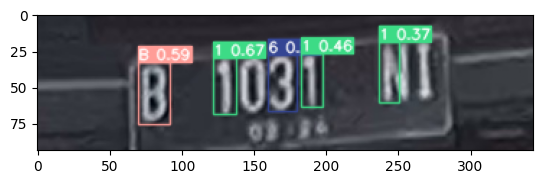

In [ ]:
pred = '/content/yolov5/runs/detect/exp27/DataTest65.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

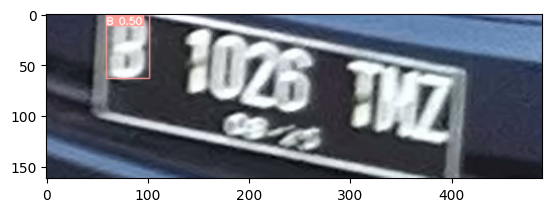

In [ ]:
pred = '/content/yolov5/runs/detect/exp26/DataTest45.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

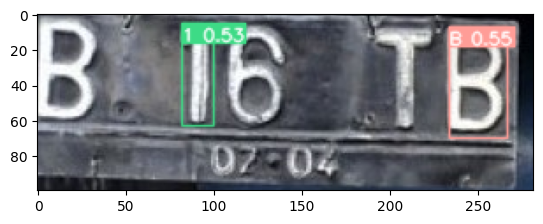

In [ ]:
pred = '/content/yolov5/runs/detect/exp23/DataTest3.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

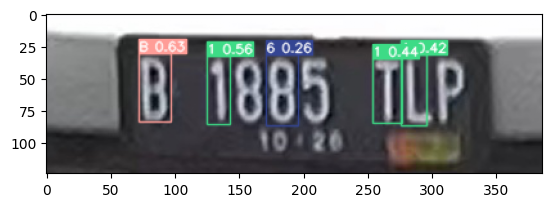

In [ ]:
pred = '/content/yolov5/runs/detect/exp22/DataTest90.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

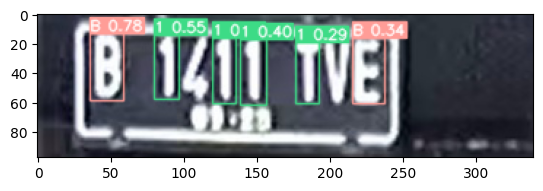

In [ ]:
pred = '/content/yolov5/runs/detect/exp21/DataTest84.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

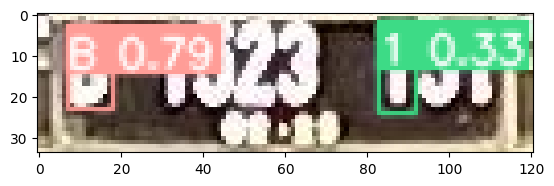

In [ ]:
pred = '/content/yolov5/runs/detect/exp20/DataTest77.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

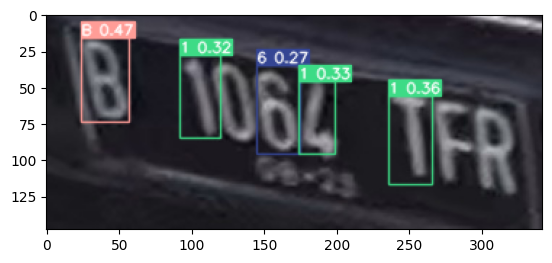

In [ ]:
pred = '/content/yolov5/runs/detect/exp19/DataTest7.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

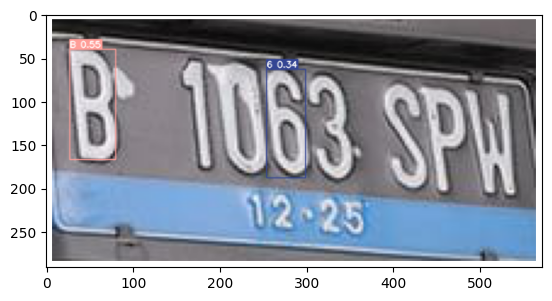

In [ ]:
pred = '/content/yolov5/runs/detect/exp18/DataTest55.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

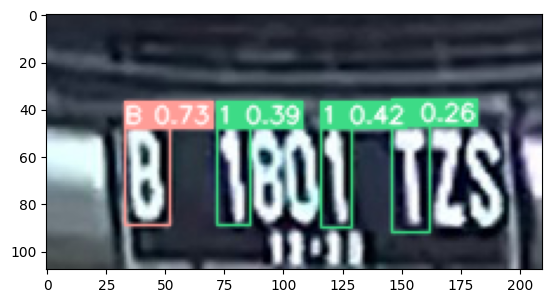

In [ ]:
pred = '/content/yolov5/runs/detect/exp15/DataTest15.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

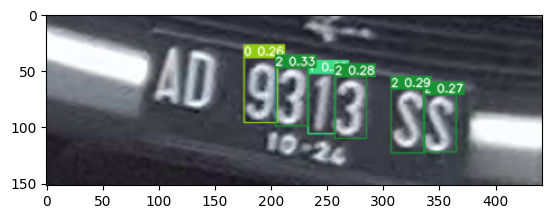

In [ ]:
pred = '/content/yolov5/runs/detect/exp14/DataTest13.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

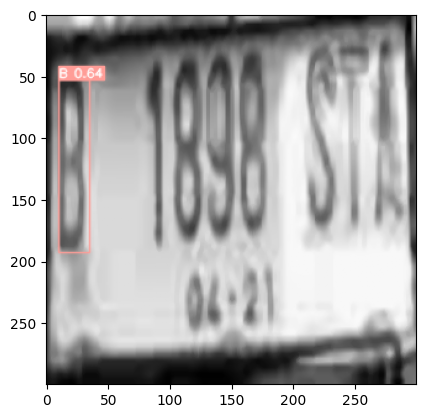

In [ ]:
pred = '/content/yolov5/runs/detect/exp13/DataTrain49.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

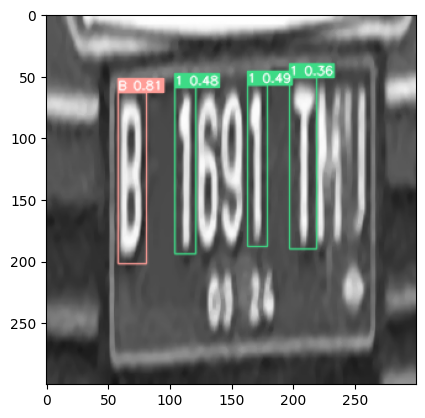

In [ ]:
pred = '/content/yolov5/runs/detect/exp12/DataTrain41.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

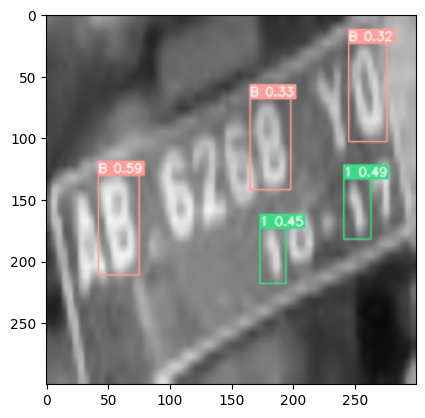

In [ ]:
pred = '/content/yolov5/runs/detect/exp7/DataTrain8.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

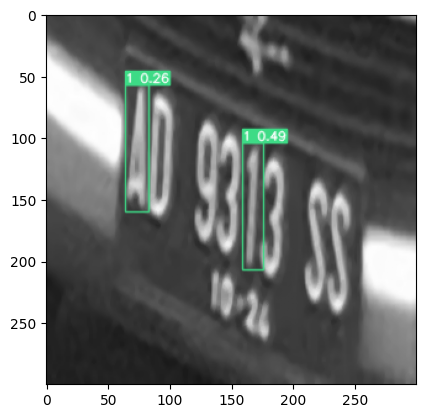

In [ ]:
pred = '/content/yolov5/runs/detect/exp6/DataTrain85.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

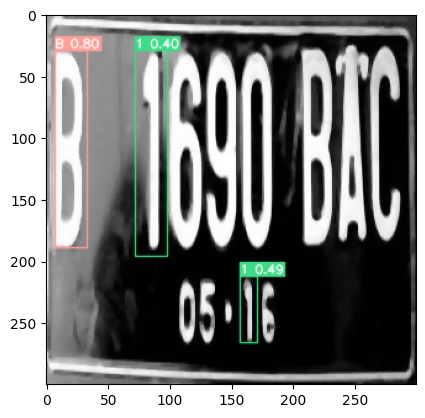

In [ ]:
pred = '/content/yolov5/runs/detect/exp5/DataTrain778.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

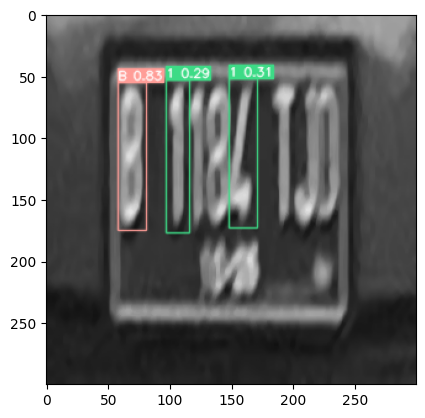

In [ ]:
pred = '/content/yolov5/runs/detect/exp4/DataTrain50.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

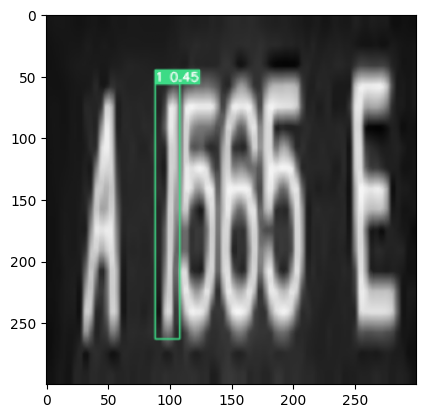

In [ ]:
pred = '/content/yolov5/runs/detect/exp3/DataTrain30.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

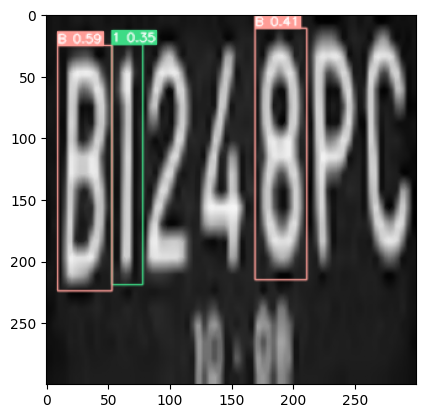

In [ ]:
pred = '/content/yolov5/runs/detect/exp2/DataTrain110.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()


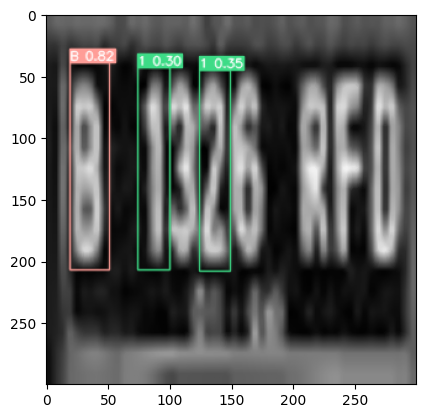

In [ ]:
pred = '/content/yolov5/runs/detect/exp/DataTrain99.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()


In [ ]:
pred = '/content/yolov5/runs/detect/exp24/DataTrain778.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

pred = '/content/yolov5/runs/detect/exp23/DataTrain753.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

pred = '/content/yolov5/runs/detect/exp19/DataTrain109.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

pred = '/content/yolov5/runs/detect/exp18/DataTrain31.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

pred = '/content/yolov5/runs/detect/exp16/DataTrain42.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

pred = '/content/yolov5/runs/detect/exp10/DataTrain82.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

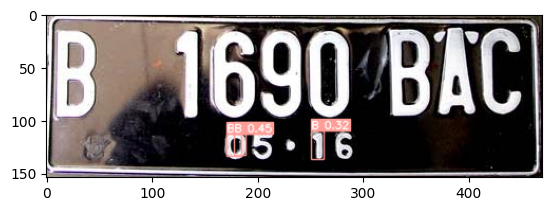

In [ ]:
pred = '/content/yolov5/runs/detect/exp24/DataTrain778.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

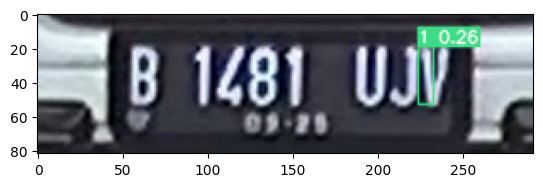

In [ ]:
pred = '/content/yolov5/runs/detect/exp23/DataTrain753.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

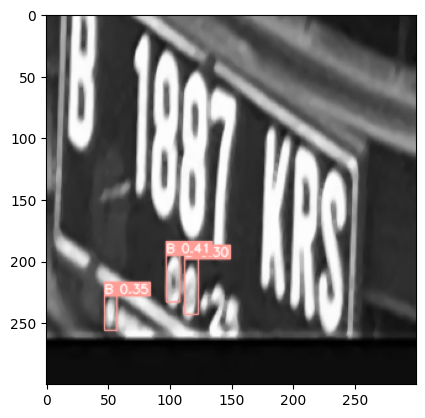

In [ ]:
pred = '/content/yolov5/runs/detect/exp19/DataTrain109.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

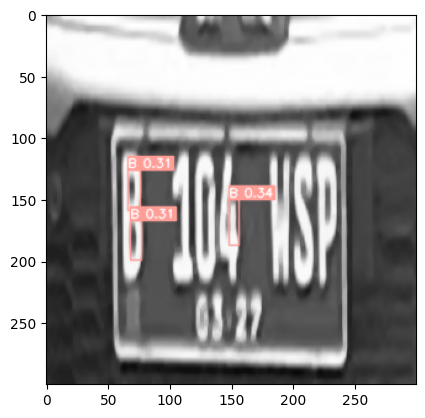

In [ ]:
pred = '/content/yolov5/runs/detect/exp18/DataTrain31.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

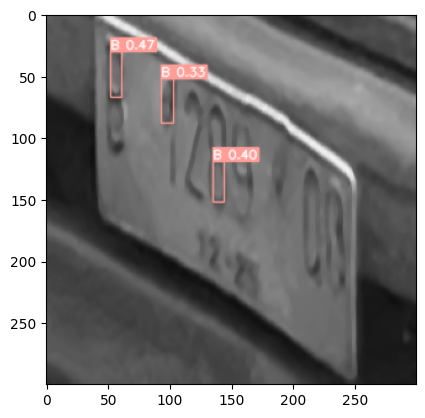

In [ ]:
pred = '/content/yolov5/runs/detect/exp16/DataTrain42.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

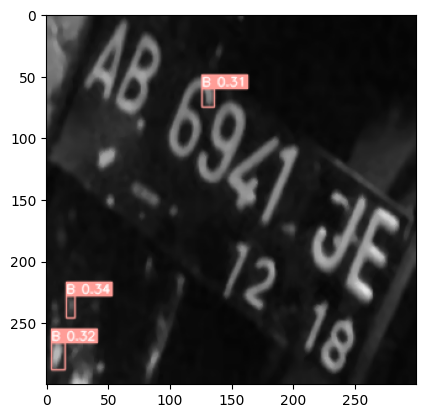

In [ ]:
pred = '/content/yolov5/runs/detect/exp10/DataTrain82.png'
img = plt.imread(pred)
plt.imshow(img)
plt.show()

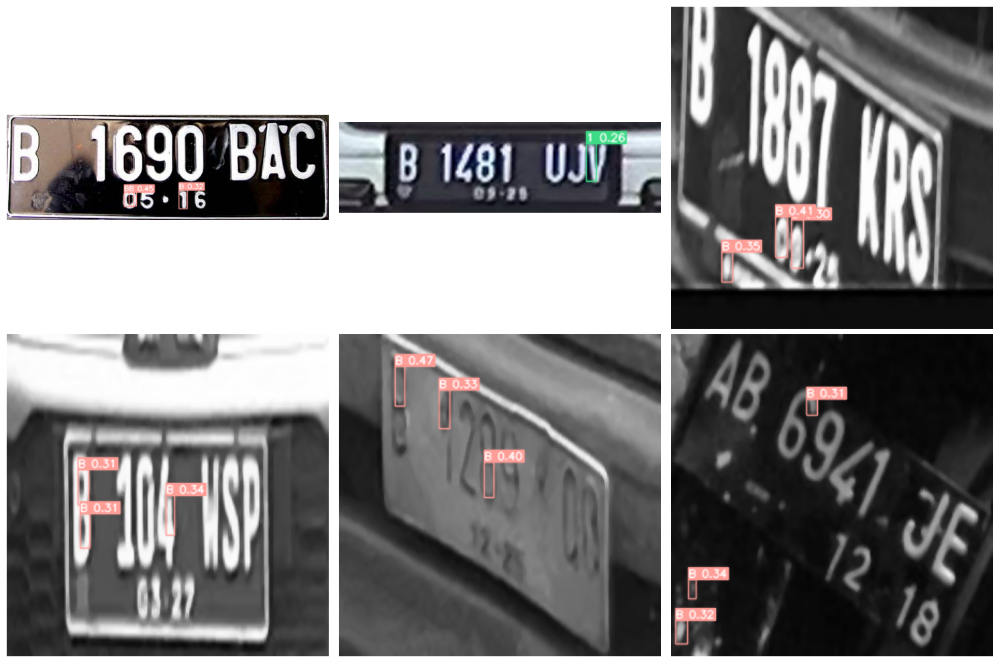

In [ ]:
import matplotlib.pyplot as plt

pred_files = [
    '/content/yolov5/runs/detect/exp24/DataTrain778.png',
    '/content/yolov5/runs/detect/exp23/DataTrain753.png',
    '/content/yolov5/runs/detect/exp19/DataTrain109.png',
    '/content/yolov5/runs/detect/exp18/DataTrain31.png',
    '/content/yolov5/runs/detect/exp16/DataTrain42.png',
    '/content/yolov5/runs/detect/exp10/DataTrain82.png'
]
fig = plt.figure(figsize=(15, 10))
for i, pred_file in enumerate(pred_files):
    img = plt.imread(pred_file)
    ax = fig.add_subplot(2, 3, i+1)
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
# def segregate_data(df, img_path, label_path, train_img_path, train_label_path):
#   filenames = []
#   for filename in df.image:
#     filenames.append(filename)
#   filenames = set(filenames)

#   for filename in filenames:
#     yolo_list = []

#     for _,row in df[df.image == filename].iterrows():
#       yolo_list.append([row.labelasli, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

#     yolo_list = np.array(yolo_list)
#     txt_filename = os.path.join(train_label_path,str(row.image.split('.')[0])+".txt")
#     # Save the .img & .txt files to the corresponding train and validation folders
#     np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
#     shutil.copyfile(os.path.join(img_path,row.image), os.path.join(train_img_path,row.image))

In [ ]:
# segregate_data(combined_df, '/content/outputimg300300/outputimg300300', combined_df, train_img_path, train_label_path)